In [126]:
!pip install statsmodels

In [127]:
pip install --upgrade nbformat

Note: you may need to restart the kernel to use updated packages.


In [128]:
pip install plotly

In [129]:
pip install chart-studio

In [130]:
pip install --upgrade matplotlib

Note: you may need to restart the kernel to use updated packages.


In [131]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from prophet import Prophet

import statsmodels.api as sm
from scipy import stats
from plotly import tools
import chart_studio.plotly as py
import plotly.figure_factory as ff
import chart_studio.tools as tls
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

from chart_studio.plotly import plot, iplot
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

import matplotlib.pyplot as plt
print(plt.style.available)

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


# Stock ADRO

In [132]:
# load data ADRO
adro = pd.read_csv('Stock/ADRO.JK.csv')
adro

,Date,Open,High,Low,Close,Adj Close,Volume
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0
...,...,...,...,...,...,...,...
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0
3963,2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN


In [133]:
# tambahkan kolom baru
adro['Kode'] = 'ADRO'
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO
...,...,...,...,...,...,...,...,...
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO
3963,2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,ADRO


In [134]:
# Deskripsi Data
adro.describe()

,Open,High,Low,Close,Adj Close,Volume
count,3963.000000,3963.000000,3963.000000,3963.000000,3963.000000,3.963000e+03
mean,1667.719909,1695.072925,1639.196316,1666.039364,940.088417,6.272563e+07
std,740.315670,749.697534,730.660112,740.615182,677.749970,5.346780e+07
min,440.000000,452.000000,437.000000,437.000000,180.426666,0.000000e+00
25%,1150.000000,1170.000000,1125.000000,1145.000000,530.285584,2.869315e+07
50%,1520.000000,1550.000000,1490.000000,1520.000000,740.071960,4.817750e+07
75%,2050.000000,2095.000000,2025.000000,2050.000000,938.087708,7.987805e+07
max,4140.000000,4250.000000,4080.000000,4140.000000,3610.000000,5.399952e+08


In [135]:
# Informasi Data ADRO
adro.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3965 entries, 0 to 3964
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       3965 non-null   object 
 1   Open       3963 non-null   float64
 2   High       3963 non-null   float64
 3   Low        3963 non-null   float64
 4   Close      3963 non-null   float64
 5   Adj Close  3963 non-null   float64
 6   Volume     3963 non-null   float64
 7   Kode       3965 non-null   object 
dtypes: float64(6), object(2)
memory usage: 247.9+ KB


In [136]:
adro = adro.dropna()

In [137]:
adro.isna().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Kode         0
dtype: int64

In [138]:
# Ubah tipe data Date
df_adro = adro.copy()

df_adro['Date'] = pd.to_datetime(df_adro['Date'], format="%Y-%m-%d")

df_adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO
...,...,...,...,...,...,...,...,...
3959,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO


In [139]:
# Informasi Data ADRO
df_adro.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3963 entries, 0 to 3964
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       3963 non-null   datetime64[ns]
 1   Open       3963 non-null   float64       
 2   High       3963 non-null   float64       
 3   Low        3963 non-null   float64       
 4   Close      3963 non-null   float64       
 5   Adj Close  3963 non-null   float64       
 6   Volume     3963 non-null   float64       
 7   Kode       3963 non-null   object        
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 278.6+ KB


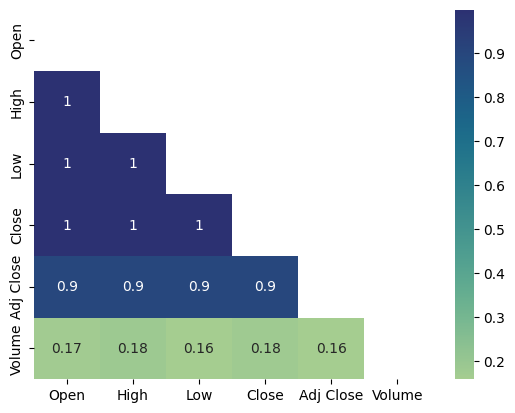

In [140]:
mask_adro = np.triu(np.ones_like(adro.corr(numeric_only=True))).astype(bool)
sns.heatmap(adro.corr(numeric_only=True), annot=True, mask=mask_adro, cmap='crest')
plt.show()

In [141]:
px.area(adro, x='Date', y='Close')

In [142]:
# Basic bar plot
fig = px.bar(adro, x='Date', y='Volume', color_discrete_sequence=['#1f77b4'], width=1700, height=600)
fig.show()

In [143]:
df_adro['Date'] = pd.to_datetime(df_adro['Date'])

# Filter data selama 5 tahun terakhir
end_date = df_adro['Date'].max()
start_date = end_date - pd.DateOffset(years=5)
filtered_adro = df_adro[(df_adro['Date'] >= start_date) & (df_adro['Date'] <= end_date)]

# Buat bar chart dengan warna tunggal
fig = px.bar(filtered_adro, x='Date', y='Volume', color_discrete_sequence=['#1f77b4'], width=1700, height=600)

# Tampilkan chart
fig.show()

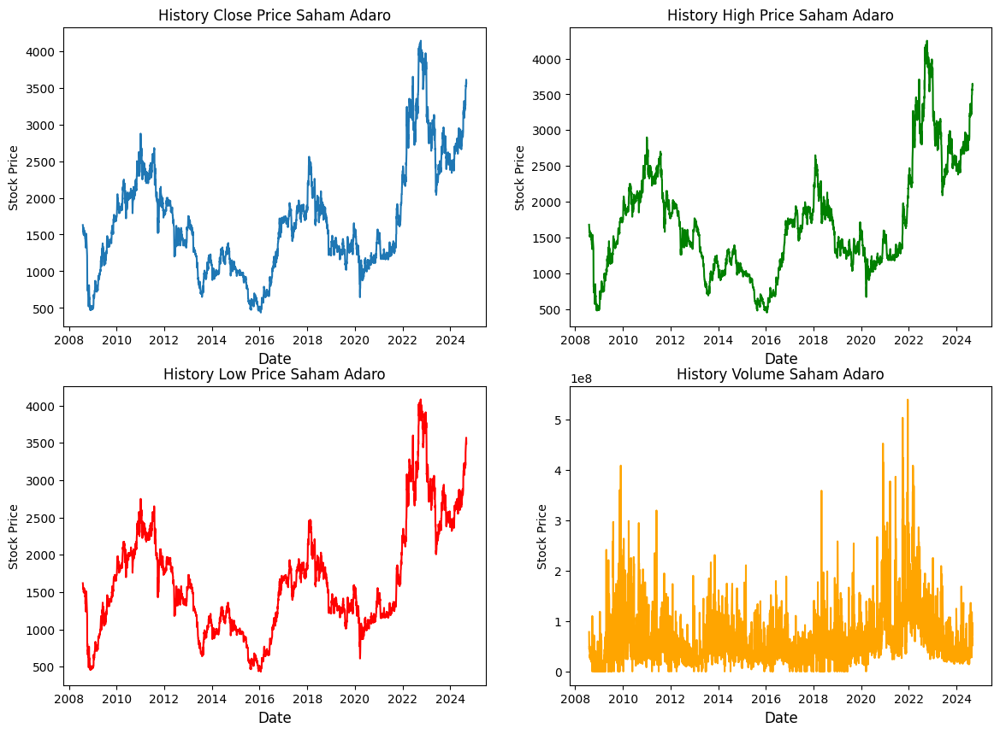

In [144]:
# Plot Harga Saham ADRO 
# Plot Pertama
f, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))
ax1.plot(df_adro["Date"], df_adro["Close"])
ax1.set_xlabel("Date", fontsize=12)
ax1.set_ylabel("Stock Price")
ax1.set_title("History Close Price Saham Adaro")

# Plot Kedua
ax2.plot(df_adro['Date'], df_adro['High'], color='green')
ax2.set_xlabel('Date', fontsize=12)
ax2.set_ylabel('Stock Price')
ax2.set_title('History High Price Saham Adaro')

# Plot Ketiga
ax3.plot(df_adro['Date'], df_adro['Low'], color='red')
ax3.set_xlabel('Date', fontsize=12)
ax3.set_ylabel('Stock Price')
ax3.set_title('History Low Price Saham Adaro')

# Plot Keempat
ax4.plot(df_adro['Date'], df_adro['Volume'], color='orange')
ax4.set_xlabel('Date', fontsize=12)
ax4.set_ylabel('Stock Price')
ax4.set_title('History Volume Saham Adaro')
plt.show()

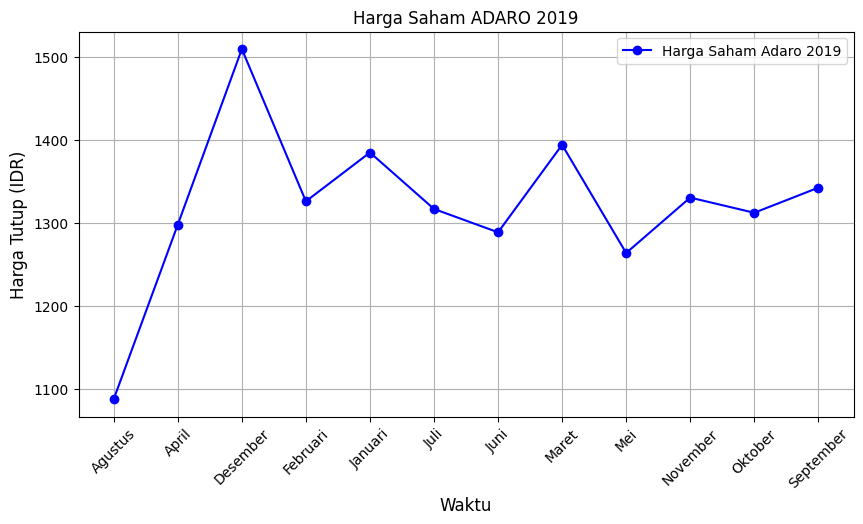

In [145]:
adro['Date'] = pd.to_datetime(adro['Date'], errors='coerce')

# Membuat kolom 'Month' dengan nama bulan (bahasa Inggris terlebih dahulu)
adro['Month'] = adro['Date'].dt.strftime('%B')

# Mengganti nama bulan ke dalam bahasa Indonesia
month_translation = {
    'January': 'Januari', 'February': 'Februari', 'March': 'Maret', 
    'April': 'April', 'May': 'Mei', 'June': 'Juni', 
    'July': 'Juli', 'August': 'Agustus', 'September': 'September', 
    'October': 'Oktober', 'November': 'November', 'December': 'Desember'
}

adro['Month'] = adro['Month'].map(month_translation)

adro_2019 = adro[adro['Date'].dt.year==2019]

# Mengelompokkan data berdasarkan 'Month' dan menghitung rata-rata harga penutupan ('Close') setiap bulan
adro_2019_grouped = adro_2019.groupby('Month')['Close'].mean().reset_index()

plt.figure(figsize=(10,5))
plt.plot(adro_2019_grouped['Month'], adro_2019_grouped['Close'], color='blue', marker='o', label='Harga Saham Adaro 2019')

plt.title("Harga Saham ADARO 2019")
plt.xlabel("Waktu", fontsize=12)
plt.ylabel("Harga Tutup (IDR)", fontsize=12)

plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.show()


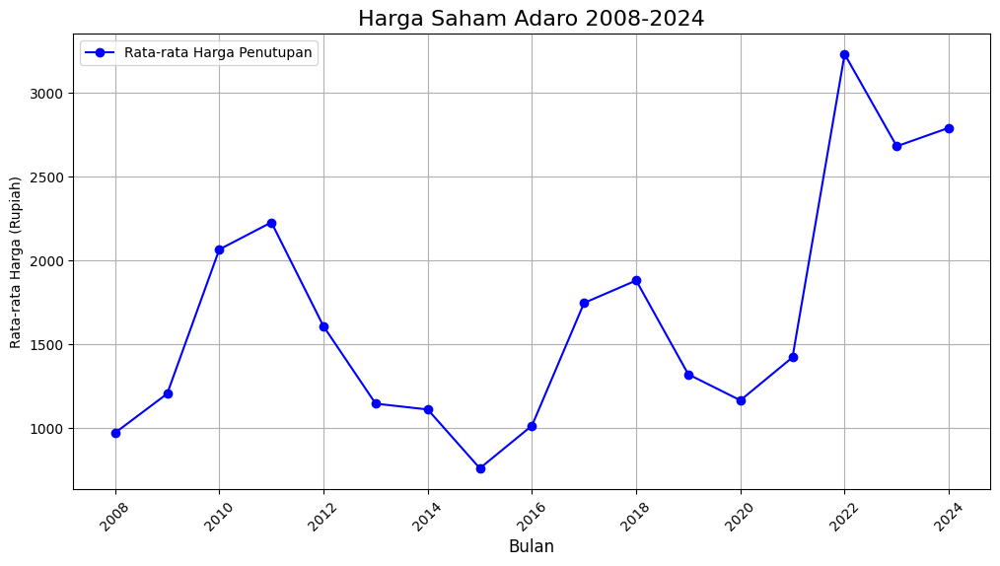

In [146]:
# Memfilter data tahun menjadi 2008-2024
adro_price = adro[(adro['Date'].dt.year >= 2008) & (adro['Date'].dt.year <= 2024)]

# Membuat kolom 'Year' dari kolom 'Date'
adro_price['Year'] = adro_price['Date'].dt.year

# Mengelompokkan data berdasarkan kolom Close dan menghitung rata-rata harga Close 
adro_price_2008_2024 = adro_price.groupby('Year')['Close'].mean().reset_index()

# Membuat visualisasi line chart berdasarkan kolom 'Close', dikelompokkan per bulan
plt.figure(figsize=(12, 6))
plt.plot(adro_price_2008_2024['Year'], adro_price_2008_2024['Close'], color='blue', marker='o', label='Rata-rata Harga Penutupan')

# Judul dan label
plt.title('Harga Saham Adaro 2008-2024', fontsize=16)
plt.xlabel('Bulan', fontsize=12)
plt.ylabel('Rata-rata Harga (Rupiah)')

# Legend dan Grid
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)

plt.show()

In [147]:
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,Month
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO,Agustus
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO,Agustus
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO,Agustus
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO,Agustus
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO,Agustus
...,...,...,...,...,...,...,...,...,...
3959,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO,Agustus
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO,Agustus
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO,Agustus
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO,September


In [148]:
model = Prophet()

# Drop columns
model_df = df_adro.drop(['Open', 'High', 'Low', 'Volume', 'Kode', 'Adj Close'], axis=1)
model_df.rename(columns={'Close' : 'y', 'Date' : 'ds'}, inplace=True)

model_df

,ds,y
0,2008-08-01,1630.0
1,2008-08-04,1590.0
2,2008-08-05,1550.0
3,2008-08-06,1540.0
4,2008-08-07,1560.0
...,...,...
3959,2024-08-28,3530.0
3960,2024-08-29,3520.0
3961,2024-08-30,3560.0
3962,2024-09-02,3610.0


In [149]:
# Inisialisasi dan latih model dengan penyesuaian parameter
model = Prophet(
    yearly_seasonality=True, 
    weekly_seasonality=True
)

# Latih model
model.fit(model_df)

19:48:46 - cmdstanpy - INFO - Chain [1] start processing
19:48:51 - cmdstanpy - INFO - Chain [1] done processing


In [150]:
# Membuat tanggal prediksi
future_prices = model.make_future_dataframe(periods=730)

# prediksi harga
predict = model.predict(future_prices)
predict[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
4688,2026-08-31,4371.855398,3541.058009,5144.483980
4689,2026-09-01,4378.677415,3551.335578,5157.010831
4690,2026-09-02,4386.303631,3529.254975,5208.810403
4691,2026-09-03,4393.768775,3558.589270,5184.641336
4692,2026-09-04,4401.652400,3581.186433,5224.789979


In [151]:
from sklearn.metrics import mean_absolute_error

df_actual = model_df[['ds', 'y']].rename(columns={'y': 'y_actual'})  # Ubah nama kolom 'y' menjadi 'y_actual' untuk perbandingan
df_combined = pd.merge(df_actual, predict[['ds', 'yhat']], on='ds', how='inner')

# Hitung MAE (Mean Absolute Error)
mae = mean_absolute_error(df_combined['y_actual'], df_combined['yhat'])

# Hitung MAPE (Mean Absolute Percentage Error)
mape = (abs(df_combined['y_actual'] - df_combined['yhat']) / df_combined['y_actual']).mean() * 100

print(f'MAE: {mae:.2f}')
print(f'MAPE: {mape:.2f}%')

MAE: 252.18
MAPE: 16.79%


In [152]:
df_actual.tail()

,ds,y_actual
3959,2024-08-28,3530.0
3960,2024-08-29,3520.0
3961,2024-08-30,3560.0
3962,2024-09-02,3610.0
3964,2024-09-04,3560.0


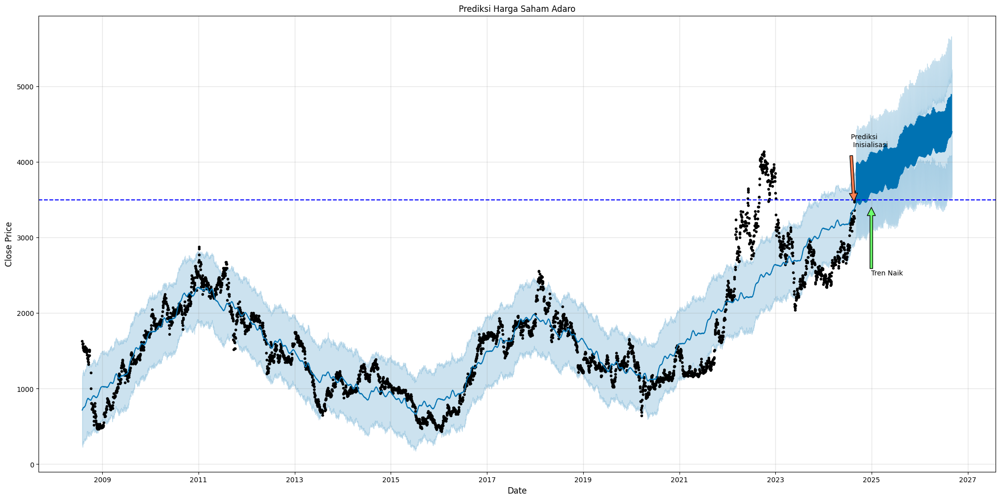

In [153]:
import matplotlib.dates as mdates

# Dates
start_date = dt.datetime(2024, 7, 27)
start_date1 = mdates.date2num(start_date)

trend_date = dt.datetime(2024, 12, 30)
trend_date1 = mdates.date2num(trend_date)

point_arrow = dt.datetime(2024, 8, 23)
point_arrow1 = mdates.date2num(point_arrow)

# plot
fig, ax1 = plt.subplots(figsize=(25, 12))
model.plot(predict, ax=ax1)
ax1.set_title('Prediksi Harga Saham Adaro')
ax1.set_xlabel('Date', fontsize=12)
ax1.set_ylabel('Close Price', fontsize=12)

# anotasi
ax1.annotate('Prediksi \n Inisialisasi', xy=(point_arrow1, 3400), xytext=(start_date1, 4200), 
             arrowprops=dict(facecolor='#ff7f50', shrink=0.1),
             )
ax1.annotate('Tren Naik', xy=(trend_date1, 3400), xytext=(trend_date1, 2500), 
             arrowprops=dict(facecolor='#6cff6c', shrink=0.0),
             )

ax1.axhline(y=3500, color='b', linestyle='--')
plt.show()

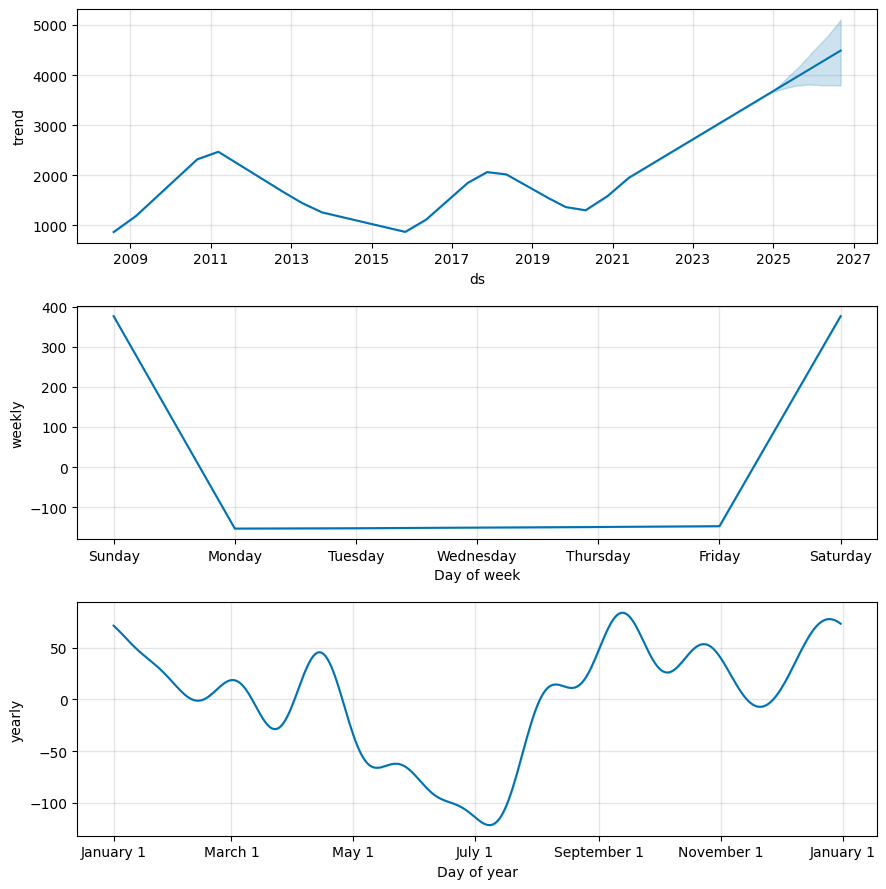

In [154]:
fig2 = model.plot_components(predict)
plt.show()

19:49:00 - cmdstanpy - INFO - Chain [1] start processing
19:49:04 - cmdstanpy - INFO - Chain [1] done processing


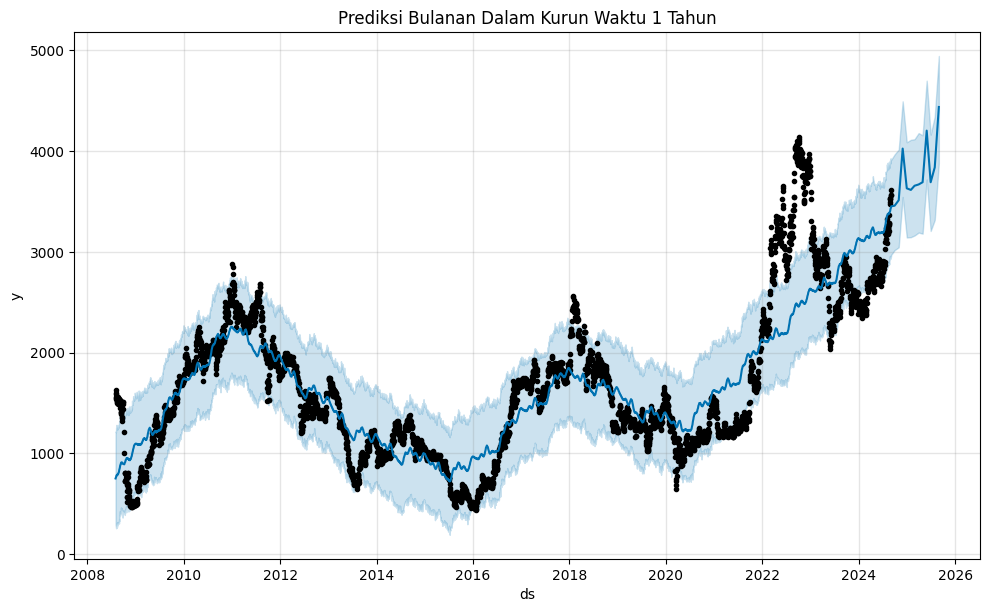

In [155]:
# Prediksi Data Bulanan
model_adro = Prophet(changepoint_prior_scale=0.02).fit(model_df)
future = model_adro.make_future_dataframe(periods=12, freq='M')
forecast = model_adro.predict(future)
fig = model_adro.plot(forecast)
plt.title('Prediksi Bulanan Dalam Kurun Waktu 1 Tahun')

# menampilkan plot
plt.show()

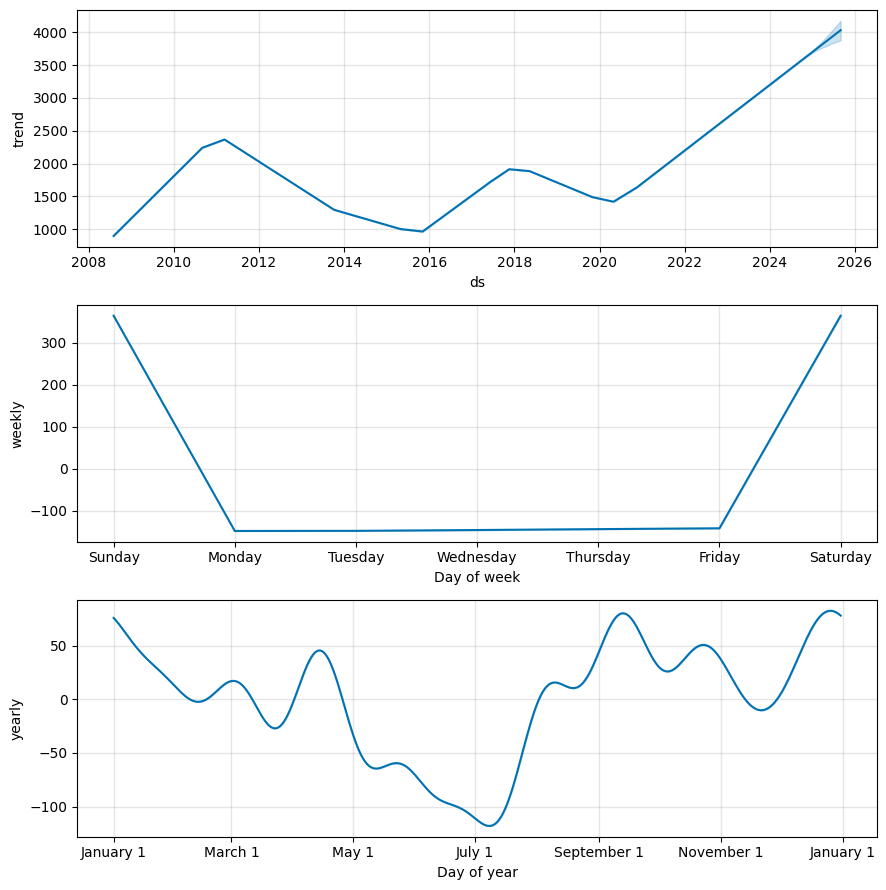

In [156]:
fig = model_adro.plot_components(forecast)
plt.show()

In [157]:
# Membuat plot OHLC
trade = go.Ohlc(
    x=df_adro['Date'],
    open=df_adro['Open'],
    high=df_adro['High'],
    low=df_adro['Low'],
    close=df_adro['Close'],
    increasing=dict(line=dict(color='#58FA58')),
    decreasing=dict(line=dict(color='#FA5858'))
)

# Mengatur layout
layout = {
    'title': 'Perkembangan Harga Saham Adaro',
    'xaxis': {
        'title': 'Date',
        'rangeslider': {'visible': False}
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)'
    },
    'shapes': [{
        'x0': '2018-12-01', 'x1': '2018-12-01',
        'y0': 0, 'y1': 1, 'xref': 'x', 'yref': 'paper',
        'line': {'color': 'rgb(30,30,30)', 'width': 1}
    }],
    # Anda dapat mengaktifkan anotasi jika diperlukan
    # 'annotations': [{
    #     'x': '2020-01-30', 'y': 0.05, 'xref': 'x', 'yref': 'paper',
    #     'showarrow': False, 'xanchor': 'left',
    #     'text': 'Demo besar besar'
    # }]
}

# Membuat figur
data = [trade]
fig = go.Figure(data=data, layout=layout)

# Tampilkan plot
#plot(fig, filename='simple_ohlc.html')  # Menyimpan sebagai file HTML
fig.show()


In [158]:
# Membuat plot OHLC
trade = go.Ohlc(
    x=df_adro['Date'],
    open=df_adro['Open'],
    high=df_adro['High'],
    low=df_adro['Low'],
    close=df_adro['Close'],
    increasing=dict(line=dict(color='#58FA58')),
    decreasing=dict(line=dict(color='#FA5858'))
)

# Mengatur layout
layout = {
    'title': 'Perkembangan Harga Saham Adaro',
    'xaxis' : {
        'title' : 'Waktu', 
        'rangeslider' : {'visible' : False},
        'gridcolor' : 'rgba(255, 255, 255, 0.2)'},
    'yaxis' : {
        'title' : 'Harga Saham (IDR)',
        'gridcolor' : 'rgba(255, 255, 255, 0.2)'},
    'paper_bgcolor' : 'black',
    'plot_bgcolor' : 'black',
    'font' : {
        'color' : 'white'
    },
    'width' : 1000,
    'height' : 600 
}

# Membuat figur
data = [trade]
fig = go.Figure(data=data, layout=layout)

# Tampilkan plot
#plot(fig, filename='simple_ohlc.html')  # Menyimpan sebagai file HTML
fig.show()


In [159]:
filter_adro = df_adro[(df_adro['Date'] >= '2020-01-01') & (df_adro['Date'] <= '2024-09-04')]

trade = go.Ohlc(x=filter_adro['Date'],
                open=filter_adro['Open'],
                high=filter_adro['High'],
                low=filter_adro['Low'],
                close=filter_adro['Close'],
                increasing=dict(line=dict(color='#58FA58')),
                decreasing=dict(line=dict(color='#FA5858')))

layout = {
    'title' : 'Data History Adaro',
    'xaxis' : {'title' : 'Waktu', 'rangeslider' : {'visible' : False}},
    'yaxis' : {'title' : 'Harga Saham (IDR)'},
    'width' : 1000,
    'height' : 600
}

data = [trade]

fig = go.Figure(data=data, layout=layout)
fig.show()

In [160]:
filter_adro = df_adro[(df_adro['Date'] >= '2020-01-01') & (df_adro['Date'] <= '2024-09-04')]

trade = go.Ohlc(x=filter_adro['Date'],
                open=filter_adro['Open'],
                high=filter_adro['High'],
                low=filter_adro['Low'],
                close=filter_adro['Close'],
                increasing=dict(line=dict(color='#58FA58')),
                decreasing=dict(line=dict(color='#FA5858')))

layout = {
    'title' : {
        'text' : 'Data History Adaro',
        'x' : 0.5,
        'xanchor' : 'center',
        'yanchor' : 'top'
    },
    'xaxis' : {
        'title' : 'Waktu', 
        'rangeslider' : {'visible' : False},
        'gridcolor' : 'rgba(255, 255, 255, 0.2)'},
    'yaxis' : {
        'title' : 'Harga Saham (IDR)',
        'gridcolor' : 'rgba(255, 255, 255, 0.2)'},
    'paper_bgcolor' : 'black',
    'plot_bgcolor' : 'black',
    'font' : {
        'color' : 'white'
    },
    'width' : 1000,
    'height' : 600
}

data = [trade]

fig = go.Figure(data=data, layout=layout)
fig.show()

In [161]:
lima_tahun_terakhir = df_adro.loc[df_adro['Date'].dt.year > 2019]

date = lima_tahun_terakhir.groupby(['Date'])
rata_bulan = date.aggregate({"Open" : np.mean, "High" : np.mean, "Low" : np.mean, "Close" : np.mean})
rata_bulan.reset_index(level=0, inplace=True)

Trade = go.Candlestick(x=rata_bulan['Date'],
                       open=rata_bulan['Open'].values.tolist(),
                       high=rata_bulan['High'].values.tolist(),
                       low=rata_bulan['Low'].values.tolist(),
                       close=rata_bulan['Close'].values.tolist(),
                       increasing=dict(line=dict(color='#58FA58')),
                       decreasing=dict(line=dict(color='#FA5858')))

layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham Adaro <br> 5 Tahun Terakhir </i>',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {'title': 'Waktu', 'rangeslider': {'visible': False}},
    'yaxis': {'title': 'Harga Saham (IDR)'},
    'width' : 1200,
    'height' : 700
}

data = [Trade]

fig = go.Figure(data=data, layout=layout)
fig.show()

In [162]:
lima_tahun_terakhir = df_adro.loc[df_adro['Date'].dt.year > 2019]

date = lima_tahun_terakhir.groupby(['Date'])
rata_bulan = date.aggregate({"Open" : np.mean, "High" : np.mean, "Low" : np.mean, "Close" : np.mean})
rata_bulan.reset_index(level=0, inplace=True)

Trade = go.Candlestick(x=rata_bulan['Date'],
                       open=rata_bulan['Open'].values.tolist(),
                       high=rata_bulan['High'].values.tolist(),
                       low=rata_bulan['Low'].values.tolist(),
                       close=rata_bulan['Close'].values.tolist(),
                       increasing=dict(line=dict(color='#58FA58')),
                       decreasing=dict(line=dict(color='#FA5858')))

layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham Adaro <br> 5 Tahun Terakhir </i>',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1000,
    'height' : 600
}

data = [Trade]

fig = go.Figure(data=data, layout=layout)
fig.show()

In [163]:
df_adro['month_year'] = pd.to_datetime(df_adro['Date']).dt.to_period('M')

tahun_terakhir = df_adro.loc[df_adro['Date'].dt.year > 2023]

date = tahun_terakhir.groupby(['Date'])
rata_bulan = date.aggregate({"Open" : np.mean, "High" : np.mean, "Low" : np.mean, "Close" : np.mean})
rata_bulan.reset_index(level=0, inplace=True)

Trade = go.Candlestick(x=rata_bulan['Date'],
                       open=rata_bulan['Open'].values.tolist(),
                       high=rata_bulan['High'].values.tolist(),
                       low=rata_bulan['Low'].values.tolist(),
                       close=rata_bulan['Close'].values.tolist(),
                       increasing=dict(line=dict(color='#58FA58')),
                       decreasing=dict(line=dict(color='#FA5858')))

layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham Adaro <br> 1 Tahun Terakhir </i>',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 500
}

data = [Trade]

fig = go.Figure(data=data, layout=layout)
fig.show()

In [164]:
df_adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,month_year
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO,2008-08
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO,2008-08
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO,2008-08
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO,2008-08
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO,2008-08
...,...,...,...,...,...,...,...,...,...
3959,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO,2024-08
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO,2024-08
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO,2024-08
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO,2024-09


In [165]:
# moving average (10, 50, 200)
df_adro['10_day_avg'] = df_adro.Close.rolling(window=10).mean()
df_adro['50_day_avg'] = df_adro.Close.rolling(window=50).mean()
df_adro['200_day_avg'] = df_adro.Close.rolling(window=200).mean()
close_p = df_adro['Close'].values.tolist()

# variabel di-insert ke plotly
ten_day = df_adro['10_day_avg'].values.tolist()
fifty_day = df_adro['50_day_avg'].values.tolist()
two_hundred_day = df_adro['200_day_avg'].values.tolist()
date = df_adro['Date'].values.tolist()

# mengatur data menjadi index
df_adro = df_adro.set_index('Date')

In [166]:
fig = make_subplots(rows=2, cols=1, shared_xaxes=True)

colors = ['#FF4500', '#92A1CF', '#6E6E6E']
avgs   = ['10_day_avg', '50_day_avg', '200_day_avg']

for col, c in zip(avgs, colors):
    fig.append_trace({'x' : df_adro.index, 'y' : df_adro[col], 'type' : 'scatter', 'name' : col, 'line' : {'color' : c}}, 1, 1)

for col in ['Close']:
    fig.append_trace({'x' : df_adro.index, 'y' : df_adro[col], 'type' : 'scatter', 'name' : 'Harga Tutup', 'line' : {'color' : '#01DF3A'}}, 2, 1)

fig['layout'].update(height = 800, title = 'Keterkaitan Moving Average <br> dan Harga Tutup Saham',
                     paper_bgcolor='#F2DFCE', plot_bgcolor='#F2DFCE')

fig.show()

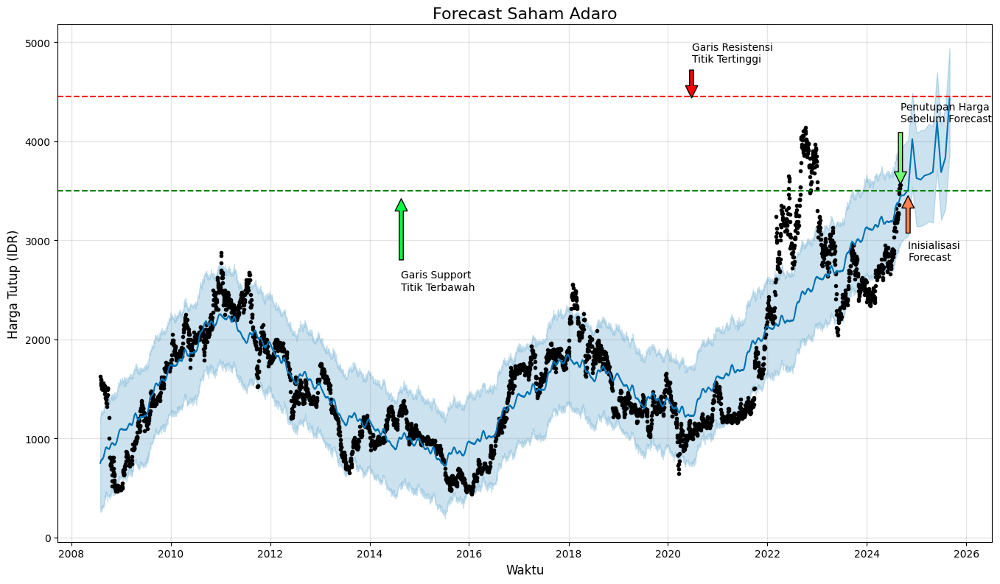

In [167]:
# Tanggal inisialisasi, tren, resistance, dan support
start_date = dt.datetime(2024, 9, 5)
start_date1 = mdates.date2num(start_date)

trend_date = dt.datetime(2024, 9, 4)
trend_date1 = mdates.date2num(trend_date)

point_arrow = dt.datetime(2024, 10, 30)
point_arrow1 = mdates.date2num(point_arrow)

resistance_date = dt.datetime(2020, 6, 23)
resistance_date1 = mdates.date2num(resistance_date)

support_date = dt.datetime(2014, 8, 21)
support_date1 = mdates.date2num(support_date)

# Plot forecast menggunakan Prophet
fig = model.plot(forecast)
ax1 = fig.gca()

# Mengatur judul dan label sumbu
ax1.set_title('Forecast Saham Adaro', fontsize=16)
ax1.set_xlabel('Waktu', fontsize=12)
ax1.set_ylabel('Harga Tutup (IDR)', fontsize=12)

# Panah Inisialisasi Forecast
ax1.annotate('Inisialisasi \nForecast', xy=(point_arrow1, 3500), xytext=(point_arrow1, 2800),
             arrowprops=dict(facecolor='#FF7F50', shrink=0.1))

# Panah Trend Harga
ax1.annotate('Penutupan Harga \nSebelum Forecast', xy=(trend_date1, 3500), xytext=(trend_date1, 4200),
             arrowprops=dict(facecolor='#6CFF6C', shrink=0.1))

# Garis Resistance
ax1.annotate('Garis Resistensi \nTitik Tertinggi'.format(forecast['yhat'].max()), 
             xy=(resistance_date1, 4400), xytext=(resistance_date1, 4800),
             arrowprops=dict(facecolor='#FF0000', shrink=0.1))

# Garis Support
ax1.annotate('Garis Support \nTitik Terbawah', xy=(support_date1, 3500), xytext=(support_date1, 2500),
             arrowprops=dict(facecolor='#00FF40', shrink=0.1))

# Garis horizontal untuk resistance dan support
ax1.axhline(y=4450, color='r', linestyle='--')
ax1.axhline(y=3500, color='g', linestyle='--')

fig.set_size_inches(14, 8)

plt.show()

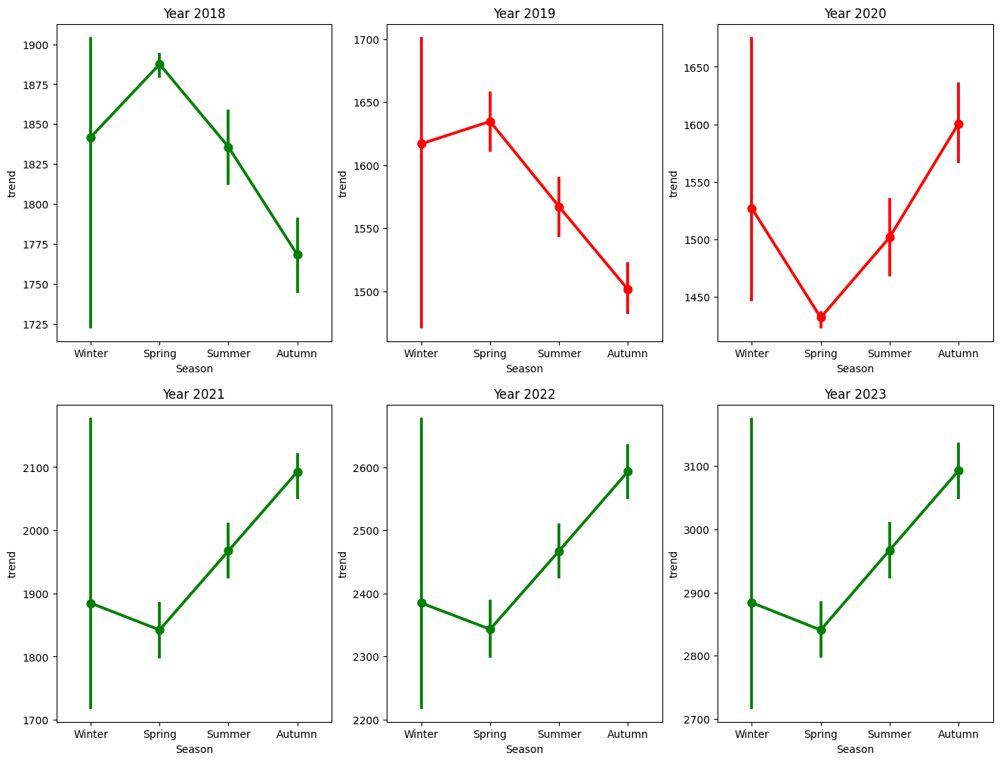

In [168]:
forecast_monthly = forecast.resample('M', on='ds').mean()
forecast_monthly = forecast_monthly.reset_index()

forecast_monthly['month_int'] = forecast_monthly['ds'].dt.month
forecast_monthly['year'] = forecast_monthly['ds'].dt.year

forecast_monthly['month'] = np.nan
list = [forecast_monthly]

for column in list :
    column.loc[column["month_int"] == 1, "month"] = "Januari"
    column.loc[column["month_int"] == 2, "month"] = "Februari"
    column.loc[column["month_int"] == 3, "month"] = "Maret"
    column.loc[column["month_int"] == 4, "month"] = "April"
    column.loc[column["month_int"] == 5, "month"] = "Mei"
    column.loc[column["month_int"] == 6, "month"] = "Juni"
    column.loc[column["month_int"] == 7, "month"] = "Juli"
    column.loc[column["month_int"] == 8, "month"] = "Augustus"
    column.loc[column["month_int"] == 9, "month"] = "September"
    column.loc[column["month_int"] == 10, "month"] = "Oktober"
    column.loc[column["month_int"] == 11, "month"] = "November"
    column.loc[column["month_int"] == 12, "month"] = "Desember"

forecast_monthly['season'] = np.nan
list2 = [forecast_monthly]

for column in list2 :
    column.loc[(column['month_int'] > 2) & (column['month_int'] <= 5), 'Season'] = 'Spring'
    column.loc[(column['month_int'] > 5) & (column['month_int'] <= 8), 'Season'] = 'Summer'
    column.loc[(column['month_int'] > 8) & (column['month_int'] <= 11), 'Season'] = 'Autumn'
    column.loc[column['month_int'] <= 2, 'Season'] = 'Winter'
    column.loc[column['month_int'] == 12, 'Season'] = 'Winter'

df_2018 = forecast_monthly.loc[(forecast_monthly["year"] == 2018)]
df_2019 = forecast_monthly.loc[(forecast_monthly["year"] == 2019)]
df_2020 = forecast_monthly.loc[(forecast_monthly["year"] == 2020)]
df_2021 = forecast_monthly.loc[(forecast_monthly["year"] == 2021)]
df_2022 = forecast_monthly.loc[(forecast_monthly["year"] == 2022)]
df_2023 = forecast_monthly.loc[(forecast_monthly["year"] == 2023)]

f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,12))


# Year 2013
sns.pointplot(x="Season", y="trend",
                    data=df_2018, ax=ax1, color="g")

# Year 2014
sns.pointplot(x="Season", y="trend",
                    data=df_2019, ax=ax2, color="r")

# Year 2015
sns.pointplot(x="Season", y="trend",
                    data=df_2020, ax=ax3, color="r")


# Year 2016
sns.pointplot(x="Season", y="trend",
                    data=df_2021, ax=ax4, color="g")

# Year 2017
sns.pointplot(x="Season", y="trend",
                    data=df_2022, ax=ax5, color="g")

# Year 2018
sns.pointplot(x="Season", y="trend",
                    data=df_2023, ax=ax6, color="g")

ax1.set_title("Year 2018")
ax2.set_title("Year 2019")
ax3.set_title("Year 2020")
ax4.set_title("Year 2021")
ax5.set_title("Year 2022")
ax6.set_title("Year 2023")

# Oil dips
# September 2014 and June 2015
ax2.annotate('First Major \n Oil Price \n Decline \n(Starts Here)', xy=(3, 44), xytext=(2.8,38.5),
            arrowprops=dict(facecolor='#81F781', shrink=0.1),
            )


ax3.annotate('Second \n Major \n Oil Price \n Decline \n(Starts Here)', xy=(1, 46.8), xytext=(1,44),
            arrowprops=dict(facecolor='#81F781', shrink=0.1),
            )

plt.show()

# NEXT TASK STOCK ANALYSIS
##### 1. LOAD DATA SAHAM MINERAL
##### 2. DATA CLEANING
##### 3. ANALYZING DATA
##### 4. VISUALIZING HISTORICAL PERFORMANCE STOCK (ALL DATA)
##### 5. STOCK PRICES COMPARISON (ALL DATA)
##### 6. STOCK PRICES FORECASTING (PROPHET MODEL)
##### 7. CONCLUSION (EXTRA ANALYSIS, IF I CAN)

##### 1. Load Data Saham Mineral

In [169]:
adro = pd.read_csv("Stock/ADRO.JK.csv")
bumi = pd.read_csv("Stock/BUMI.JK.csv")
byan = pd.read_csv("Stock/BYAN.JK.csv")
gems = pd.read_csv("Stock/GEMS.JK.csv")
indy = pd.read_csv("Stock/INDY.JK.csv")
itmg = pd.read_csv("Stock/ITMG.JK.csv")
ptba = pd.read_csv("Stock/PTBA.JK.csv")

In [170]:
# tambahkan kolom baru pada setiap dataset
adro['Kode'] = 'ADRO'
bumi['Kode'] = 'BUMI'
byan['Kode'] = 'BYAN'
gems['Kode'] = 'GEMS'
indy['Kode'] = 'INDY'
ptba['Kode'] = 'PTBA'

In [171]:
# menggabungkan setiap data saham
stock = pd.concat([adro, bumi, byan, gems, indy, ptba])
stock

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO
...,...,...,...,...,...,...,...,...
3960,2024-08-29,2780.0,2810.0,2760.0,2780.0,2780.000000,15032300.0,PTBA
3961,2024-08-30,2780.0,2780.0,2730.0,2730.0,2730.000000,21459200.0,PTBA
3962,2024-09-02,2740.0,2820.0,2730.0,2820.0,2820.000000,30665600.0,PTBA
3963,2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,PTBA


In [172]:
# mendeteksi missing values
stock.isna().sum()

Date         0
Open         8
High         8
Low          8
Close        8
Adj Close    8
Volume       8
Kode         0
dtype: int64

In [173]:
# menangani missing values pada data saham
stock = stock.dropna()

# mengecek missing values
stock.isna().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Kode         0
dtype: int64

In [174]:
# mengubah tipe data kolom 'Date' menjadi datetime
stock['Date'] = pd.to_datetime(stock['Date'], format="%Y-%m-%d")

# mengecek informasi dataset
stock.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22948 entries, 0 to 3964
Data columns (total 8 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       22948 non-null  datetime64[ns]
 1   Open       22948 non-null  float64       
 2   High       22948 non-null  float64       
 3   Low        22948 non-null  float64       
 4   Close      22948 non-null  float64       
 5   Adj Close  22948 non-null  float64       
 6   Volume     22948 non-null  float64       
 7   Kode       22948 non-null  object        
dtypes: datetime64[ns](1), float64(6), object(1)
memory usage: 1.6+ MB


In [175]:
stock

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO
...,...,...,...,...,...,...,...,...
3959,2024-08-28,2790.0,2800.0,2770.0,2780.0,2780.000000,10744200.0,PTBA
3960,2024-08-29,2780.0,2810.0,2760.0,2780.0,2780.000000,15032300.0,PTBA
3961,2024-08-30,2780.0,2780.0,2730.0,2730.0,2730.000000,21459200.0,PTBA
3962,2024-09-02,2740.0,2820.0,2730.0,2820.0,2820.000000,30665600.0,PTBA


In [176]:
stock.describe()

,Date,Open,High,Low,Close,Adj Close,Volume
count,22948,22948.000000,22948.000000,22948.00000,22948.000000,22948.000000,2.294800e+04
mean,2016-11-10 03:38:33.613386752,2201.529501,2234.321204,2168.14644,2201.369575,1451.709866,9.134519e+07
min,2008-08-01 00:00:00,50.000000,50.000000,50.00000,50.000000,50.000000,0.000000e+00
25%,2013-01-22 00:00:00,810.000000,820.000000,802.50000,810.000000,493.928184,1.130750e+05
50%,2016-12-19 00:00:00,1770.000000,1795.000000,1735.00000,1760.000000,875.768555,1.134850e+07
75%,2020-09-18 00:00:00,2590.000000,2625.000000,2550.00000,2590.000000,1373.533051,4.729800e+07
max,2024-09-04 00:00:00,23550.000000,24800.000000,21775.00000,23400.000000,22548.171875,1.519175e+10
std,NaN,2653.761493,2695.067953,2610.48971,2656.909221,2542.705400,4.244151e+08


#### 2. Analisis Data

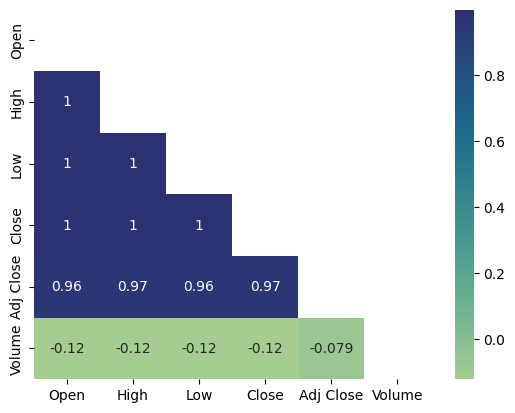

In [177]:
mask_stock = np.triu(np.ones_like(stock.corr(numeric_only=True))).astype(bool)
sns.heatmap(stock.corr(numeric_only=True), annot=True, mask=mask_stock, cmap='crest')
plt.show()

In [178]:
stock['Year'] = stock['Date'].dt.year

# Membuat line chart untuk setiap kode saham dengan warna yang berbeda
fig = px.line(stock, x='Date', y='Close', color='Kode',
              title='Harga Saham Perusahaan Tambang 2008-2024',
              labels={'Close': 'Harga (Rupiah)', 'Date': 'Tahun', 'Kode': 'Saham'},
              line_shape='linear',
              color_discrete_sequence=px.colors.qualitative.Set1)  # Menggunakan palet warna lembut

# Mengatur format sumbu x untuk hanya menampilkan tahun
fig.update_xaxes(tickformat='%Y', gridcolor='gray')  # Mengatur warna grid pada sumbu x menjadi abu-abu
fig.update_yaxes(gridcolor='gray')  # Mengatur warna grid pada sumbu y menjadi abu-abu

# Mengatur lebar dan tinggi frame
fig.update_layout(
    width=1200,  # Lebar frame
    height=650,  # Tinggi frame
    title=dict(x=0.5, font=dict(size=16, color='white')),  # Menyelaraskan judul di tengah dan mengatur warna font
    legend=dict(x=0, y=1, traceorder='normal', orientation='v', font=dict(color='white')),  # Legenda di kiri dan warna font putih
    plot_bgcolor='black',  # Warna latar belakang plot
    paper_bgcolor='black',  # Warna latar belakang kertas
    font=dict(color='white')  # Warna font putih
)

# Menampilkan plot
fig.show()

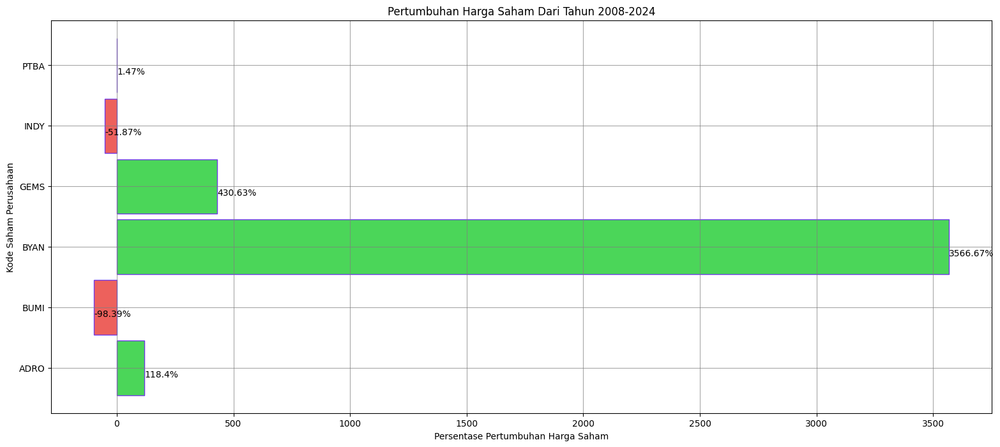

In [179]:
# Kode untuk memisahkan DataFrame berdasarkan kode saham
list_df = [df for code, df in stock.groupby('Kode')]

# Hitung harga minimum dan maksimum untuk setiap DataFrame
mini = [df[df['Date'] == df['Date'].min()]['Close'].values.item() for df in list_df]
maxi = [df[df['Date'] == df['Date'].max()]['Close'].values.item() for df in list_df]

# Hitung selisih dan pertumbuhan persentase
diff = np.array(maxi) - np.array(mini)
growth = (diff / np.array(mini)) * 100
growth_list = growth.tolist()
co_name_list = [df['Kode'].unique()[0] for df in list_df]

# Visualisasi pertumbuhan harga saham
fig, ax = plt.subplots(figsize=(19, 8))
ax.barh(y=co_name_list, width=growth_list, height=0.9, color=['#4bd659', '#ed615c', '#4bd659', '#4bd659', '#ed615c', '#4bd659'],
       edgecolor='#713ae8')

# Annotasi pertumbuhan
for p in ax.patches:
    ax.annotate(f'{round(p.get_width(), 2)}%', (p.get_width() + 1, p.get_y() + 0.3))

# Label sumbu
ax.set_xlabel('Persentase Pertumbuhan Harga Saham')
ax.set_ylabel('Kode Saham Perusahaan')
ax.set_title("Pertumbuhan Harga Saham Dari Tahun 2008-2024")

# Menambahkan grid
ax.grid(True, linestyle='-', color='gray', alpha=0.7)

plt.show()

In [180]:
# Daftar kode saham unik dari DataFrame
kode_saham_list = stock['Kode'].unique()

# Menyiapkan palet warna yang berbeda untuk setiap kode saham
warna_saham = px.colors.qualitative.Set1  # Menggunakan palet warna Set1

# Loop untuk membuat line chart untuk setiap kode saham
for i, kode in enumerate(kode_saham_list):
    # Filter DataFrame berdasarkan kode saham
    df_saham = stock[stock['Kode'] == kode]
    
    # Membuat line chart untuk kode saham
    fig = px.line(df_saham, x='Date', y='Volume', color='Kode',
                  title=f'Volume Saham {kode} 2008-2024',
                  labels={'Volume': 'Volume', 'Date': 'Tahun', 'Kode': 'Saham'},
                  line_shape='linear',
                  color_discrete_sequence=[warna_saham[i % len(warna_saham)]])  # Warna unik untuk setiap saham
    
    # Mengatur format sumbu x untuk hanya menampilkan tahun
    fig.update_xaxes(tickformat='%Y', gridcolor='gray')
    fig.update_yaxes(gridcolor='gray')
    
    # Mengatur lebar dan tinggi frame serta penampilan
    fig.update_layout(
        width=1200,
        height=650,
        title=dict(x=0.5, font=dict(size=16, color='white')),
        legend=dict(x=0, y=1, traceorder='normal', orientation='v', font=dict(color='white')),
        plot_bgcolor='black',
        paper_bgcolor='black',
        font=dict(color='white')
    )
    
    # Menampilkan plot untuk setiap kode saham
    fig.show()

In [181]:
# Daftar kode saham unik dari DataFrame
kode_saham_list = stock['Kode'].unique()

# Menyiapkan palet warna yang berbeda untuk setiap kode saham
warna_saham = px.colors.qualitative.Set1  # Menggunakan palet warna Set1

# Membuat subplots dengan 3 baris dan 3 kolom
fig = make_subplots(rows=2, cols=3, shared_xaxes=True, subplot_titles=[f'Volume Saham {kode}' for kode in kode_saham_list[:6]])

# Loop untuk menambahkan setiap grafik ke subplot
for i, kode in enumerate(kode_saham_list[:6]):  
    # Filter DataFrame berdasarkan kode saham
    df_saham = stock[stock['Kode'] == kode]
    
    # Membuat grafik line chart untuk setiap kode saham
    trace = go.Scatter(x=df_saham['Date'], y=df_saham['Volume'], mode='lines', 
                       name=f'Saham {kode}', line=dict(color=warna_saham[i % len(warna_saham)]))
    
    # Menentukan lokasi subplot (row dan col)
    row = (i // 3) + 1
    col = (i % 3) + 1
    
    # Menambahkan trace ke subplot yang sesuai
    fig.add_trace(trace, row=row, col=col)

# Mengatur format sumbu x untuk hanya menampilkan tahun
fig.update_xaxes(tickformat='%Y', gridcolor='gray')
fig.update_yaxes(gridcolor='gray')

# Mengatur lebar dan tinggi frame serta penampilan keseluruhan
fig.update_layout(
    width=1200,
    height=700,
    title=dict(text='Volume Saham Perusahaan Tambang 2008-2024', x=0.5, font=dict(size=16, color='white')),
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white'),
    showlegend=False  # Menyembunyikan legenda agar lebih rapi
)

# Menampilkan plot dengan 4 grafik dalam satu frame
fig.show()

In [182]:
fig = go.Figure()

# Loop untuk setiap kode saham yang ada di DataFrame
for name in stock['Kode'].unique():
    # Filter data berdasarkan kode saham dan tanggal
    stock_filter = stock[(stock['Kode'] == name) & (stock['Date'] >= '2008-08-01')]
    
    # Tambahkan plot scatter untuk setiap saham
    fig.add_trace(go.Scatter(x=stock_filter['Date'],
                             y=stock_filter['Volume'],
                             mode='lines',
                             name=name))

# Mengatur layout dan format plot
fig.update_layout(
    title='Volume Saham dari 2008-2024',
    xaxis_title='Tanggal',
    yaxis_title='Volume',
    plot_bgcolor='black',
    paper_bgcolor='black',
    font=dict(color='white')
)

# Menampilkan plot
fig.show()

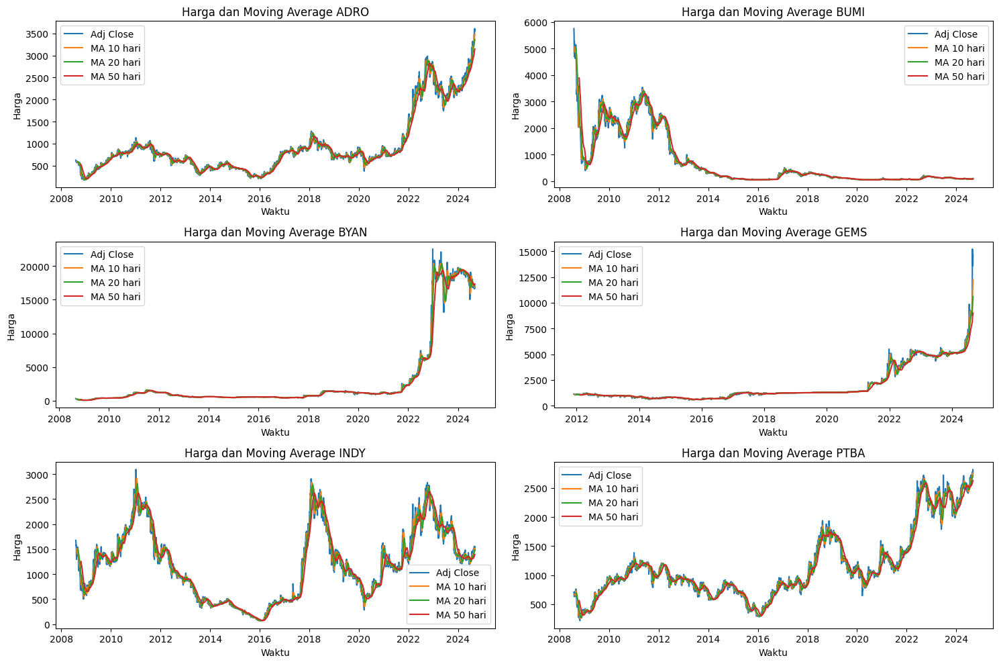

In [183]:
# Daftar periode Moving Average (MA) yang ingin dihitung
ma_day = [10, 20, 50]

# Membuat subplots 3x2
fig, axes = plt.subplots(nrows=3, ncols=2)
fig.set_figheight(10)
fig.set_figwidth(15)

# Loop untuk setiap kode saham
for i, kode in enumerate(kode_saham_list[:6]):  # Mengambil maksimal 6 kode saham
    # Filter DataFrame berdasarkan kode saham
    df_saham = stock[stock['Kode'] == kode].copy()  # Menggunakan copy untuk menghindari perubahan ke DataFrame asli
    
    # Menghitung moving average untuk setiap periode
    for ma in ma_day:
        column_name = f"MA {ma} hari"  # Nama kolom yang jelas
        df_saham[column_name] = df_saham['Adj Close'].rolling(window=ma).mean()
    
    # Tentukan lokasi subplot
    row = i // 2  # Ada 3 baris
    col = i % 2   # Ada 2 kolom
    
    # Plot Adjusted Close price dan MA
    axes[row, col].plot(df_saham['Date'], df_saham['Adj Close'], label='Adj Close')
    
    # Plot Moving Averages
    for ma in ma_day:
        column_name = f"MA {ma} hari"
        axes[row, col].plot(df_saham['Date'], df_saham[column_name], label=column_name)
    
    # Menambahkan judul, label, dan legenda
    axes[row, col].set_title(f'Harga dan Moving Average {kode}')
    axes[row, col].set_xlabel('Waktu')
    axes[row, col].set_ylabel('Harga')
    axes[row, col].legend()

# Mengatur layout agar tidak ada overlapping
plt.tight_layout()
plt.show()


#### Saham ADRO

In [184]:
adro = adro.dropna()
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO
...,...,...,...,...,...,...,...,...
3959,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO
3960,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO
3961,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO
3962,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO


In [185]:
#lima_tahun_terakhir = df_adro.loc[df_adro['Date'].dt.year > 2019]

#date = lima_tahun_terakhir.groupby(['Date'])
#rata_bulan = date.aggregate({"Open" : np.mean, "High" : np.mean, "Low" : np.mean, "Close" : np.mean})
#rata_bulan.reset_index(level=0, inplace=True)

Trade = go.Candlestick(x=adro['Date'],
                       open=adro['Open'],
                       high=adro['High'],
                       low=adro['Low'],
                       close=adro['Close']
                      )

layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham Adaro',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

fig = go.Figure(data=Trade, layout=layout)
fig.show()

In [186]:
# Pastikan 'Date' dalam format datetime
adro['Date'] = pd.to_datetime(adro['Date'])

# Membuat grafik area
fig = go.Figure()

# Menambahkan area untuk harga penutupan
fig.add_trace(go.Scatter(x=adro['Date'],
                         y=adro['Close'],
                         mode='lines',
                         fill='tozeroy',  # Mengisi area di bawah garis
                         name='Harga Penutupan',
                         line=dict(width=2, color='red'),  # Garis merah
                         fillcolor='rgba(255, 0, 0, 0.3)'))  # Area di bawah garis merah transparan

# Layout plot
layout = {
    'title': {
        'text': 'Perkembangan Harga Saham Adaro',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickformat': '%Y',  # Format label hanya tahun
        'tickmode': 'auto'
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width': 1200,
    'height': 600
}

fig.update_layout(layout)
fig.show()

In [187]:
# Filter data untuk lima tahun terakhir
lima_tahun_terakhir = adro.loc[adro['Date'].dt.year > 2019]

# Mengelompokkan berdasarkan 'Date' dan menghitung rata-rata per tanggal
date = lima_tahun_terakhir.groupby(['Date'])
rata_bulan = date.aggregate({"Open": np.mean, "High": np.mean, "Low": np.mean, "Close": np.mean})
rata_bulan.reset_index(level=0, inplace=True)

# Membuat grafik Candlestick
Trade = go.Candlestick(x=rata_bulan['Date'],
                       open=rata_bulan['Open'].values.tolist(),
                       high=rata_bulan['High'].values.tolist(),
                       low=rata_bulan['Low'].values.tolist(),
                       close=rata_bulan['Close'].values.tolist())

# Garis support dan resistance
support_2020_2022 = 610
resistance_2020_2022 = 4250

support_2023_2024 = 2010
resistance_2023_2024 = 3650

# menambahkan garis support dan resistance periode 2020-2022
support_line_2020_2022 = go.Scatter(
    x = rata_bulan[(rata_bulan['Date'].dt.year >= 2020) & (rata_bulan['Date'].dt.year <= 2022)]['Date'],
    y = [support_2020_2022] * len(rata_bulan[(rata_bulan['Date'].dt.year >= 2020) & (rata_bulan['Date'].dt.year <= 2022)]),
    mode = 'lines',
    line = dict(color='red', dash='dash'),
    name ='Support (2020-2022)'
)

resistance_line_2020_2022 = go.Scatter(
    x = rata_bulan[(rata_bulan['Date'].dt.year >= 2020) & (rata_bulan['Date'].dt.year <= 2022)]['Date'],
    y = [resistance_2020_2022] * len(rata_bulan[(rata_bulan['Date'].dt.year >= 2020) & (rata_bulan['Date'].dt.year <= 2022)]),
    mode = 'lines',
    line = dict(color='green', dash='dash'),
    name = 'Resistance (2020-2022)'
)

# menambahkan garis support dan resistance periode 2023-2024
support_line_2023_2024 = go.Scatter(
    x = rata_bulan[(rata_bulan['Date'].dt.year >= 2023) & (rata_bulan['Date'].dt.year <= 2024)]['Date'],
    y = [support_2023_2024] * len(rata_bulan[(rata_bulan['Date'].dt.year >= 2023) & (rata_bulan['Date'].dt.year <= 2024)]),
    mode = 'lines',
    line = dict(color='red', dash='dash'),
    name='Support (2023-2024)'
)

resistance_line_2023_2024 = go.Scatter(
    x = rata_bulan[(rata_bulan['Date'].dt.year >= 2023) & (rata_bulan['Date'].dt.year <= 2024)]['Date'],
    y = [resistance_2023_2024] * len(rata_bulan[(rata_bulan['Date'].dt.year >= 2023) & (rata_bulan['Date'].dt.year <= 2024)]),
    mode = 'lines',
    line = dict(color='green', dash='dash'),
    name = 'Resistance (2023-2024)'
)

# Mengatur layout
layout = {
    'title': {
        'text': 'Perkembangan Harga Saham Adaro <br> 5 Tahun Terakhir </i>',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickformat': '%Y',  # Hanya menampilkan tahun
        'tickmode': 'linear',  # Mode linier untuk tampilan label
        'dtick': "M12"  # Menampilkan setiap tahun (interval 12 bulan)
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width': 1200,
    'height': 600
}

# Membuat dan menampilkan grafik
data = [Trade, support_line_2020_2022, support_line_2023_2024, resistance_line_2020_2022, resistance_line_2023_2024]
fig = go.Figure(data=data, layout=layout)
fig.show()

In [188]:
# Pastikan kolom 'Date' adalah tipe datetime
adro['Date'] = pd.to_datetime(adro['Date'])

# Filter data untuk tahun 2023
adro_2023 = adro[adro['Date'].dt.year == 2023]

# moving average untuk periode tertentu
ma_day = [10, 20, 50]
for ma in ma_day:
    adro_2023[f'MA {ma} hari'] = adro_2023['Close'].rolling(ma).mean()

# Membuat Candlestick chart untuk data harian di tahun 2023
candlestick = go.Candlestick(x=adro_2023['Date'],
                       open=adro_2023['Open'],
                       high=adro_2023['High'],
                       low=adro_2023['Low'],
                       close=adro_2023['Close']
                      )

# membuat line chart untuk moving averages
lines = []
for ma in ma_day:
    lines.append(go.Scatter(x=adro_2023['Date'],
                            y=adro_2023[f'MA {ma} hari'],
                            mode='lines',
                            name=f'MA {ma} hari'))

# Mendapatkan tanggal di awal setiap bulan
tickvals = pd.date_range(start='2023-01-01', end='2023-12-31', freq='MS')

# Layout untuk plot dengan label per bulan pada sumbu X
layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham Adaro (Tahun 2023)',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',  # Label pada sumbu x
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickvals': tickvals,  # Tampilkan label hanya di awal setiap bulan
        'ticktext': ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],  # Teks label bulan
        'tickangle' : -45
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',  # Label pada sumbu y
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

# Menampilkan plot dengan data harian dan label per bulan
fig = go.Figure(data=[candlestick] + lines, layout=layout)
fig.show()

In [189]:
# Pastikan kolom 'Date' adalah tipe datetime
adro['Date'] = pd.to_datetime(adro['Date'])

# Filter data untuk 5 tahun terakhir (2019-2023)
adro_5_years = adro[(adro['Date'].dt.year >= 2019) & (adro['Date'].dt.year <= 2024)]

# Moving average untuk periode tertentu
ma_day = [10, 20, 50]
for ma in ma_day:
    adro_5_years[f'MA {ma} hari'] = adro_5_years['Close'].rolling(ma).mean()

# Membuat Candlestick chart untuk data harian dari 2019 hingga 2024
candlestick_adro_5 = go.Candlestick(x=adro_5_years['Date'],
                             open=adro_5_years['Open'],
                             high=adro_5_years['High'],
                             low=adro_5_years['Low'],
                             close=adro_5_years['Close'],
                             increasing={'line' : {'color' : '#1c7c55', 'width' : 3}},
                             decreasing={'line' : {'color' : '#ec1c24', 'width' : 3}})

# Membuat line chart untuk moving averages
lines = []
for ma in ma_day:
    lines.append(go.Scatter(x=adro_5_years['Date'],
                            y=adro_5_years[f'MA {ma} hari'],
                            mode='lines',
                            name=f'MA {ma} hari'))

# Mendapatkan tanggal di awal setiap tahun
tickvals = pd.date_range(start='2019-01-01', end='2024-09-04', freq='YS')

# Layout untuk plot dengan label per tahun pada sumbu X
layout = {
    'title': {
        'text' : 'Perkembangan Harga Saham Adaro (2019 - 2023)',
        'x' : 0.5,
        'xanchor' : 'center',
        'yanchor' : 'top'
    },
    'xaxis': {
        'title': 'Waktu',  # Label pada sumbu x
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickvals': tickvals,  # Tampilkan label hanya di awal setiap tahun
        'ticktext': ['2019', '2020', '2021', '2022', '2023', '2024'],  # Teks label tahun
        'tickangle': -45
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',  # Label pada sumbu y
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

# Menampilkan plot dengan data harian dan label per tahun
fig = go.Figure(data=[candlestick_adro_5] + lines, layout=layout)
fig.show()

In [190]:
# Menambahkan kolom 'Month' untuk pengelompokan berdasarkan bulan
adro['Month'] = adro['Date'].dt.to_period('M')  # Kelompokkan berdasarkan bulan

# Ambil harga penutupan untuk awal dan akhir bulan
monthly_return = adro.groupby('Month')['Adj Close'].agg(['first', 'last']).reset_index()

# Hitung return bulanan
monthly_return['Monthly Return'] = (monthly_return['last'] / monthly_return['first']) - 1

# Gabungkan kembali kolom 'Monthly Return' ke DataFrame asli berdasarkan kolom 'Month'
adro = adro.merge(monthly_return[['Month', 'Monthly Return']], on='Month', how='left')

# Menampilkan hasil untuk memeriksa apakah kolom 'Monthly Return' telah ditambahkan
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,Month,Monthly Return
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO,2008-08,-0.055215
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO,2008-08,-0.055215
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO,2008-08,-0.055215
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO,2008-08,-0.055215
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO,2008-08,-0.055215
...,...,...,...,...,...,...,...,...,...,...
3958,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO,2024-08,0.095385
3959,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO,2024-08,0.095385
3960,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO,2024-08,0.095385
3961,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO,2024-09,-0.013850


In [191]:
adro = adro.dropna()
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,Month,Monthly Return
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO,2008-08,-0.055215
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO,2008-08,-0.055215
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO,2008-08,-0.055215
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO,2008-08,-0.055215
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO,2008-08,-0.055215
...,...,...,...,...,...,...,...,...,...,...
3958,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO,2024-08,0.095385
3959,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO,2024-08,0.095385
3960,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO,2024-08,0.095385
3961,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO,2024-09,-0.013850


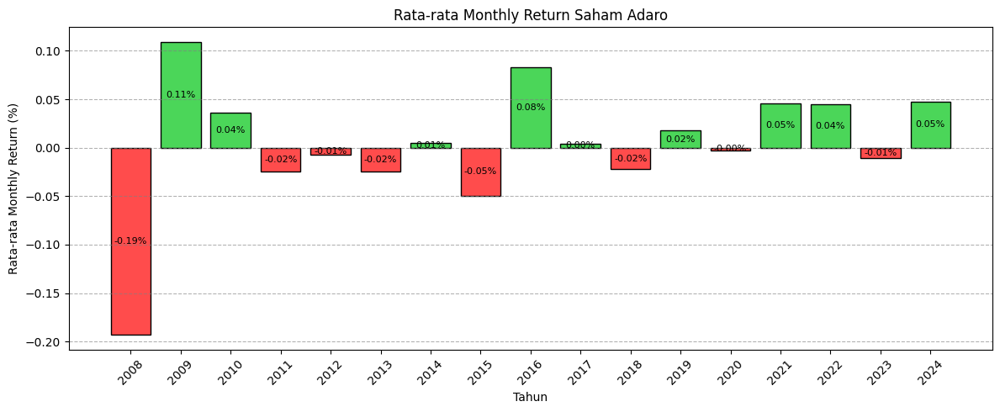

In [192]:
# Menambahkan kolom 'Year' untuk pengelompokan berdasarkan tahun
adro['Year'] = adro['Date'].dt.year

# Menghitung rata-rata Monthly Return per tahun
annual_return = adro.groupby('Year')['Monthly Return'].mean().reset_index()

# Ambil tahun dan rata-rata bulanan untuk visualisasi
years = annual_return['Year']
monthly_returns = annual_return['Monthly Return']

# Membuat figure dan axis untuk vertical bar chart dengan ukuran yang lebih kecil
fig, ax = plt.subplots(figsize=(12, 5))  # Ukuran grafik disesuaikan

# Menentukan warna bar berdasarkan nilai Monthly Return
colors = ['#ff4c4c' if value < 0 else '#4bd659' for value in monthly_returns]

# Membuat vertical bar chart dengan warna yang disesuaikan
bars = ax.bar(x=years, height=monthly_returns, color=colors, edgecolor='black')

# Menambahkan anotasi persentase return di dalam setiap bar
for bar in bars:
    height = bar.get_height()
    # Menambahkan label di dalam bar dengan font size lebih kecil dan warna hitam
    ax.text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.2f}%', 
            ha='center', va='center', color='black', fontsize=8)

# Menambahkan label sumbu dan judul
ax.set_xlabel('Tahun')
ax.set_ylabel('Rata-rata Monthly Return (%)')
ax.set_title('Rata-rata Monthly Return Saham Adaro')

# Menampilkan hanya tahun pada sumbu X
ax.set_xticks(years)  # Mengatur ticks pada sumbu X
ax.set_xticklabels(years, rotation=45)  # Mengatur label pada ticks

# Menambahkan grid vertikal
ax.grid(True, linestyle='--', color='gray', alpha=0.6, axis='y')

# Menyesuaikan layout agar lebih rapi
plt.tight_layout()

# Menampilkan plot
plt.show()

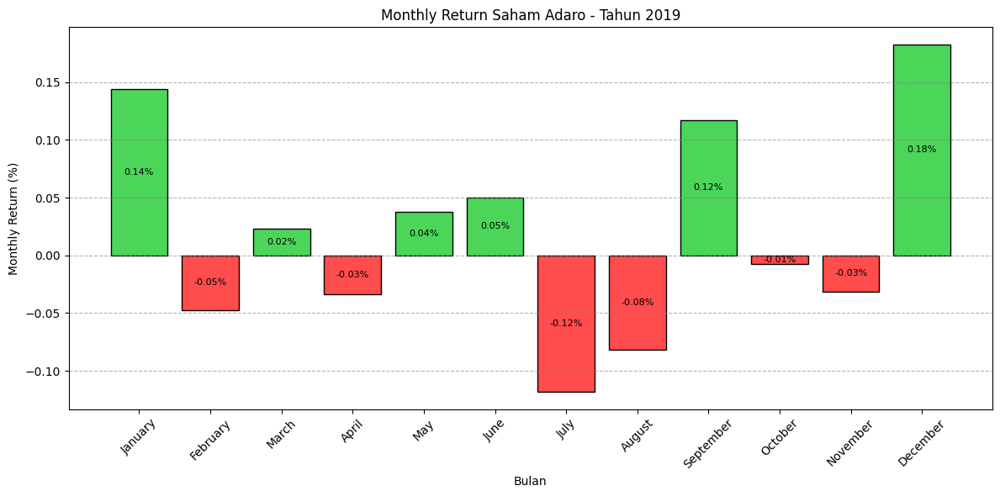

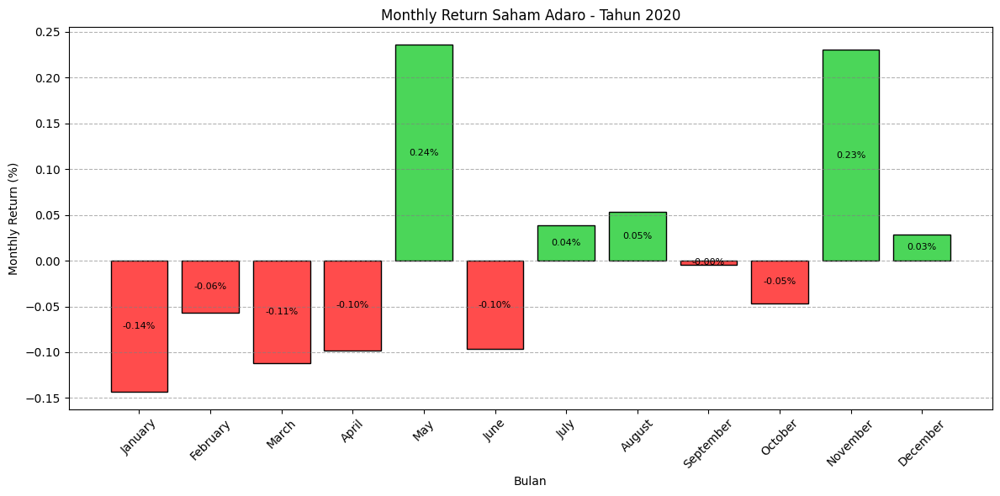

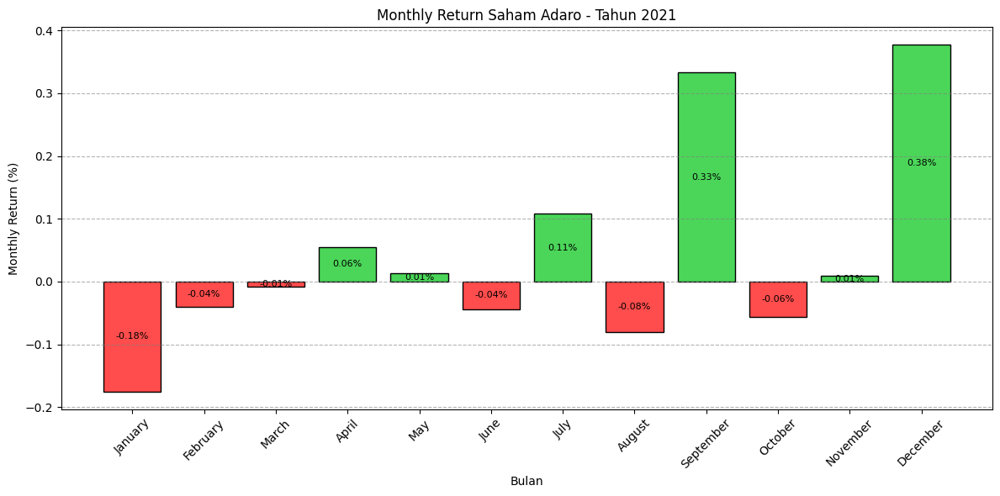

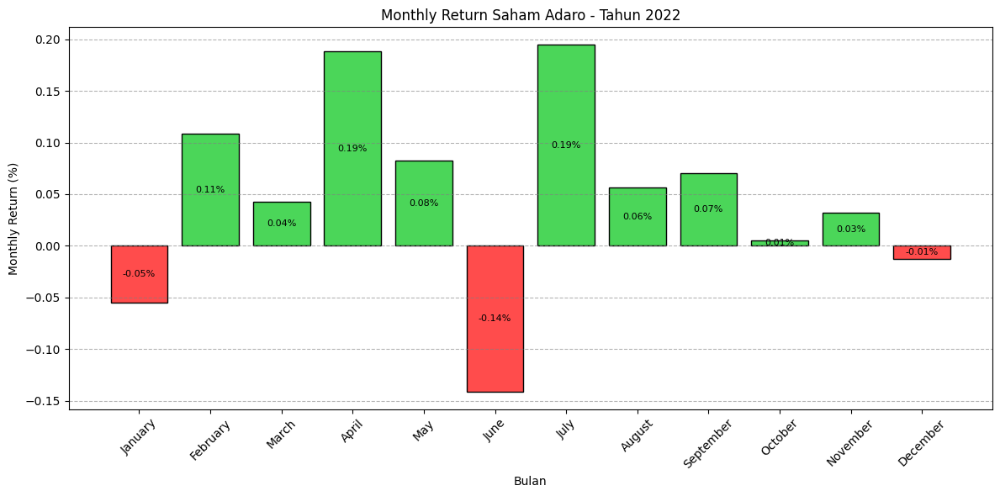

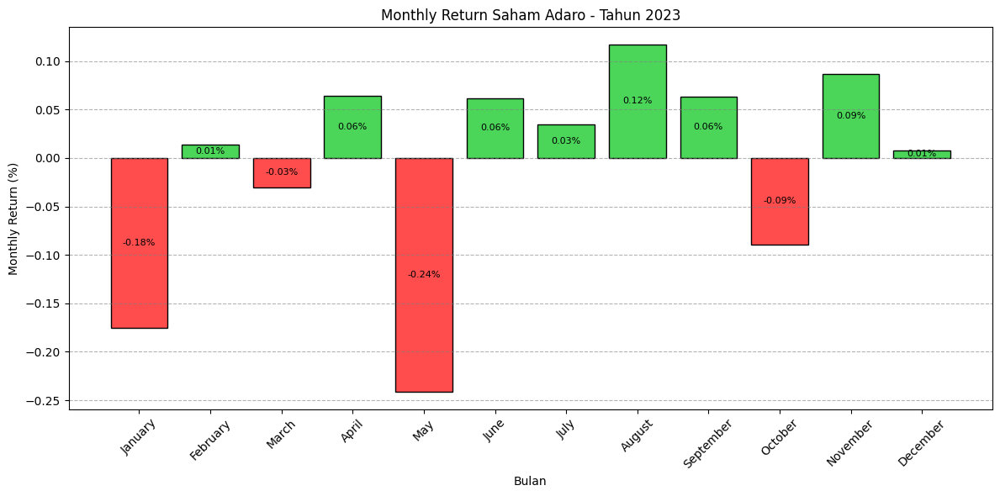

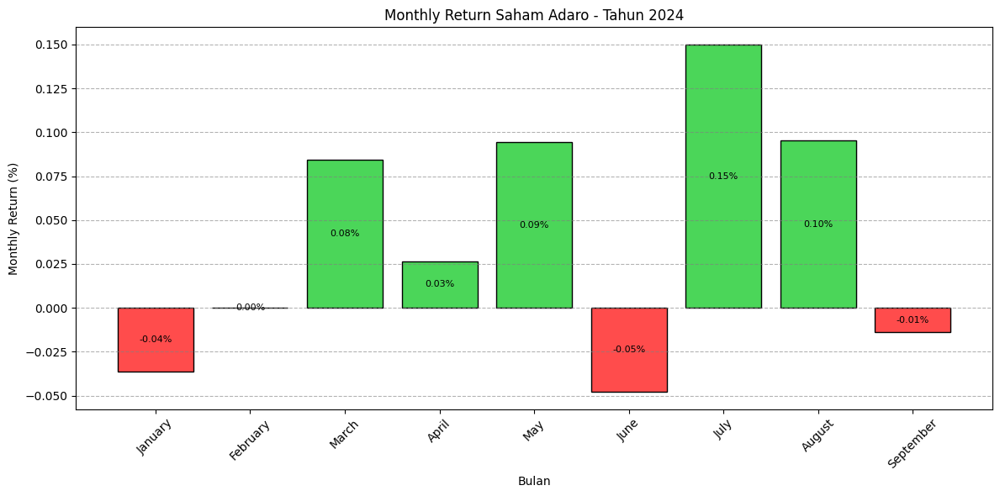

In [193]:
import calendar

# Menambahkan kolom 'Month' dan 'Year' untuk pengelompokan
adro['Month'] = adro['Date'].dt.to_period('M')  # Bulan dan Tahun
adro['Year'] = adro['Date'].dt.year

# Ambil harga penutupan untuk awal dan akhir bulan
monthly_return = adro.groupby(['Year', 'Month'])['Adj Close'].agg(['first', 'last']).reset_index()

# Hitung return bulanan
monthly_return['Monthly Return'] = (monthly_return['last'] / monthly_return['first']) - 1

# Loop untuk tahun dari 2019 hingga 2024
for year in range(2019, 2025):
    # Pilih data untuk tahun tertentu
    monthly_return_year = monthly_return[monthly_return['Year'] == year]

    # Buat label bulan dalam format nama bulan
    monthly_return_year['Month'] = monthly_return_year['Month'].dt.month
    monthly_return_year['Month Name'] = monthly_return_year['Month'].apply(lambda x: calendar.month_name[x])

    # Membuat figure dan axis untuk vertical bar chart
    fig, ax = plt.subplots(figsize=(12, 6))  # Ukuran grafik disesuaikan

    # Menentukan warna bar berdasarkan nilai Monthly Return
    colors = ['#ff4c4c' if value < 0 else '#4bd659' for value in monthly_return_year['Monthly Return']]

    # Membuat vertical bar chart dengan warna yang disesuaikan
    bars = ax.bar(
        x=monthly_return_year['Month Name'],
        height=monthly_return_year['Monthly Return'],
        color=colors,
        edgecolor='black'
    )

    # Menambahkan anotasi persentase return di dalam setiap bar
    for bar in bars:
        height = bar.get_height()
        # Menambahkan label di dalam bar dengan font size lebih kecil dan warna hitam
        ax.text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.2f}%', 
                ha='center', va='center', color='black', fontsize=8)

    # Menambahkan label sumbu dan judul
    ax.set_xlabel('Bulan')
    ax.set_ylabel('Monthly Return (%)')
    ax.set_title(f'Monthly Return Saham Adaro - Tahun {year}')

    # Menambahkan grid vertikal
    ax.grid(True, linestyle='--', color='gray', alpha=0.6, axis='y')

    # Menyesuaikan layout agar lebih rapi
    plt.xticks(rotation=45)  # Rotasi label pada sumbu X agar tidak saling tumpang tindih
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

In [194]:
adro

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,Month,Monthly Return,Year
0,2008-08-01,1630.0,1680.0,1620.0,1630.0,625.735046,78478500.0,ADRO,2008-08,-0.055215,2008
1,2008-08-04,1590.0,1630.0,1590.0,1590.0,610.379700,43837000.0,ADRO,2008-08,-0.055215,2008
2,2008-08-05,1550.0,1580.0,1540.0,1550.0,595.024109,50244500.0,ADRO,2008-08,-0.055215,2008
3,2008-08-06,1540.0,1570.0,1540.0,1540.0,591.185242,48545500.0,ADRO,2008-08,-0.055215,2008
4,2008-08-07,1560.0,1570.0,1540.0,1560.0,598.863159,50999500.0,ADRO,2008-08,-0.055215,2008
...,...,...,...,...,...,...,...,...,...,...,...
3958,2024-08-28,3550.0,3560.0,3500.0,3530.0,3530.000000,50932800.0,ADRO,2024-08,0.095385,2024
3959,2024-08-29,3540.0,3590.0,3500.0,3520.0,3520.000000,63218700.0,ADRO,2024-08,0.095385,2024
3960,2024-08-30,3540.0,3590.0,3510.0,3560.0,3560.000000,95767700.0,ADRO,2024-08,0.095385,2024
3961,2024-09-02,3590.0,3650.0,3570.0,3610.0,3610.000000,96348100.0,ADRO,2024-09,-0.013850,2024


#### 2. Saham BUMI

In [195]:
bumi

,Date,Open,High,Low,Close,Adj Close,Volume,Kode
0,2008-08-01,6150.0,6500.0,6100.0,6150.0,5754.350586,229508000.0,BUMI
1,2008-08-04,5850.0,6150.0,5750.0,5850.0,5473.651367,141577504.0,BUMI
2,2008-08-05,5300.0,5650.0,5150.0,5300.0,4959.034180,358078496.0,BUMI
3,2008-08-06,5250.0,5550.0,5050.0,5250.0,4912.250488,263012992.0,BUMI
4,2008-08-07,5350.0,5400.0,5100.0,5350.0,5005.817383,158619504.0,BUMI
...,...,...,...,...,...,...,...,...
3960,2024-08-29,94.0,95.0,87.0,89.0,89.000000,783885400.0,BUMI
3961,2024-08-30,89.0,90.0,88.0,89.0,89.000000,314646500.0,BUMI
3962,2024-09-02,89.0,94.0,89.0,93.0,93.000000,471702900.0,BUMI
3963,2024-09-03,NaN,NaN,NaN,NaN,NaN,NaN,BUMI


In [196]:
# menghapus missing values
bumi = bumi.dropna()

# mengecek hasil hapus missing values
bumi.isna().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
Kode         0
dtype: int64

In [197]:
# Ubah kolom 'Date' menjadi tipe datetime
bumi['Date'] = pd.to_datetime(bumi['Date'])

# Menambahkan kolom 'Year' untuk pengelompokan berdasarkan tahun
bumi['Year'] = bumi['Date'].dt.year

# Menambahkan kolom 'Month' untuk pengelompokan berdasarkan bulan
bumi['Month'] = bumi['Date'].dt.to_period('M')  # Kelompokkan berdasarkan bulan

# Ambil harga penutupan untuk awal dan akhir bulan
monthly_return = bumi.groupby('Month')['Adj Close'].agg(['first', 'last']).reset_index()

# Hitung return bulanan
monthly_return['Monthly Return'] = (monthly_return['last'] / monthly_return['first']) - 1

# Gabungkan kembali kolom 'Monthly Return' ke DataFrame asli berdasarkan kolom 'Month'
bumi = bumi.merge(monthly_return[['Month', 'Monthly Return']], on='Month', how='left')

# Menampilkan hasil untuk memeriksa apakah kolom 'Monthly Return' telah ditambahkan
bumi

,Date,Open,High,Low,Close,Adj Close,Volume,Kode,Year,Month,Monthly Return
0,2008-08-01,6150.0,6500.0,6100.0,6150.0,5754.350586,229508000.0,BUMI,2008,2008-08,-0.105691
1,2008-08-04,5850.0,6150.0,5750.0,5850.0,5473.651367,141577504.0,BUMI,2008,2008-08,-0.105691
2,2008-08-05,5300.0,5650.0,5150.0,5300.0,4959.034180,358078496.0,BUMI,2008,2008-08,-0.105691
3,2008-08-06,5250.0,5550.0,5050.0,5250.0,4912.250488,263012992.0,BUMI,2008,2008-08,-0.105691
4,2008-08-07,5350.0,5400.0,5100.0,5350.0,5005.817383,158619504.0,BUMI,2008,2008-08,-0.105691
...,...,...,...,...,...,...,...,...,...,...,...
3959,2024-08-28,92.0,95.0,91.0,93.0,93.000000,310124800.0,BUMI,2024,2024-08,0.186667
3960,2024-08-29,94.0,95.0,87.0,89.0,89.000000,783885400.0,BUMI,2024,2024-08,0.186667
3961,2024-08-30,89.0,90.0,88.0,89.0,89.000000,314646500.0,BUMI,2024,2024-08,0.186667
3962,2024-09-02,89.0,94.0,89.0,93.0,93.000000,471702900.0,BUMI,2024,2024-09,0.064516


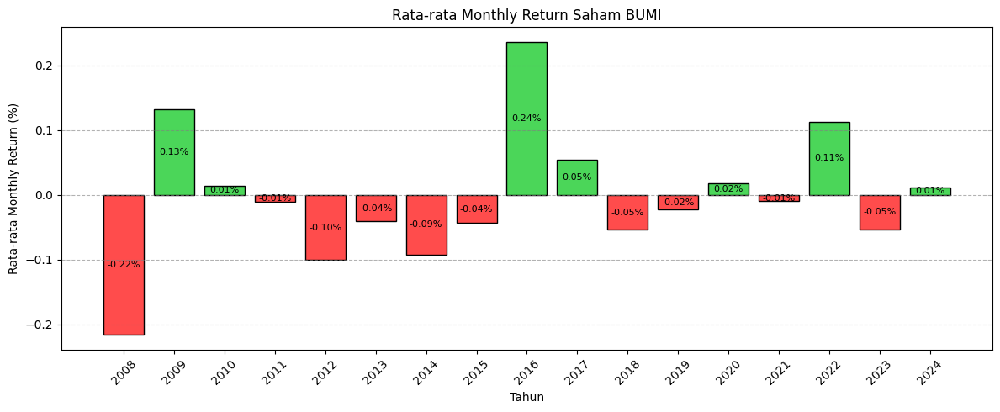

In [198]:
# Menambahkan kolom 'Year' untuk pengelompokan berdasarkan tahun
bumi['Year'] = bumi['Date'].dt.year

# Menghitung rata-rata Monthly Return per tahun
annual_return = bumi.groupby('Year')['Monthly Return'].mean().reset_index()

# Ambil tahun dan rata-rata bulanan untuk visualisasi
years = annual_return['Year']
monthly_returns = annual_return['Monthly Return']

# Membuat figure dan axis untuk vertical bar chart dengan ukuran yang lebih kecil
fig, ax = plt.subplots(figsize=(12, 5))  # Ukuran grafik disesuaikan

# Menentukan warna bar berdasarkan nilai Monthly Return
colors = ['#ff4c4c' if value < 0 else '#4bd659' for value in monthly_returns]

# Membuat vertical bar chart dengan warna yang disesuaikan
bars = ax.bar(x=years, height=monthly_returns, color=colors, edgecolor='black')

# Menambahkan anotasi persentase return di dalam setiap bar
for bar in bars:
    height = bar.get_height()
    # Menambahkan label di dalam bar dengan font size lebih kecil dan warna hitam
    ax.text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.2f}%', 
            ha='center', va='center', color='black', fontsize=8)

# Menambahkan label sumbu dan judul
ax.set_xlabel('Tahun')
ax.set_ylabel('Rata-rata Monthly Return (%)')
ax.set_title('Rata-rata Monthly Return Saham BUMI')

# Menampilkan hanya tahun pada sumbu X
ax.set_xticks(years)  # Mengatur ticks pada sumbu X
ax.set_xticklabels(years, rotation=45)  # Mengatur label pada ticks

# Menambahkan grid vertikal
ax.grid(True, linestyle='--', color='gray', alpha=0.6, axis='y')

# Menyesuaikan layout agar lebih rapi
plt.tight_layout()

# Menampilkan plot
plt.show()

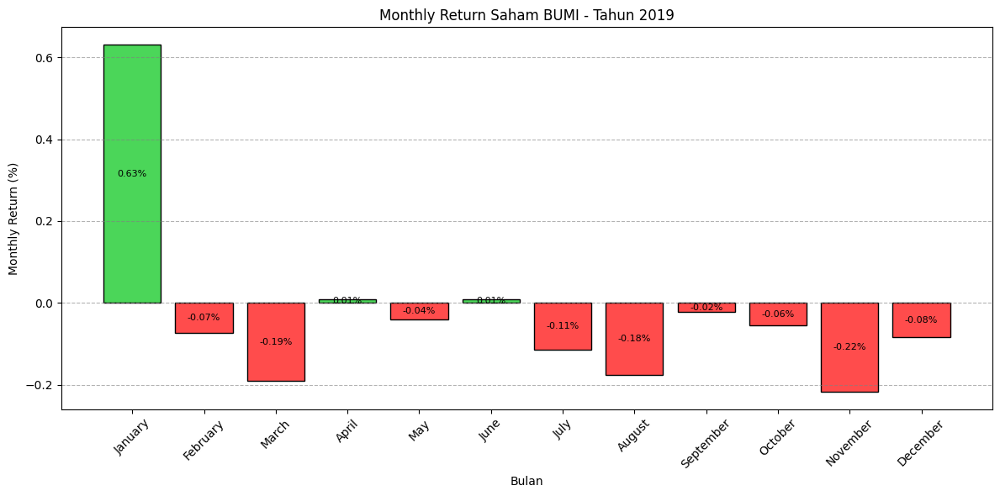

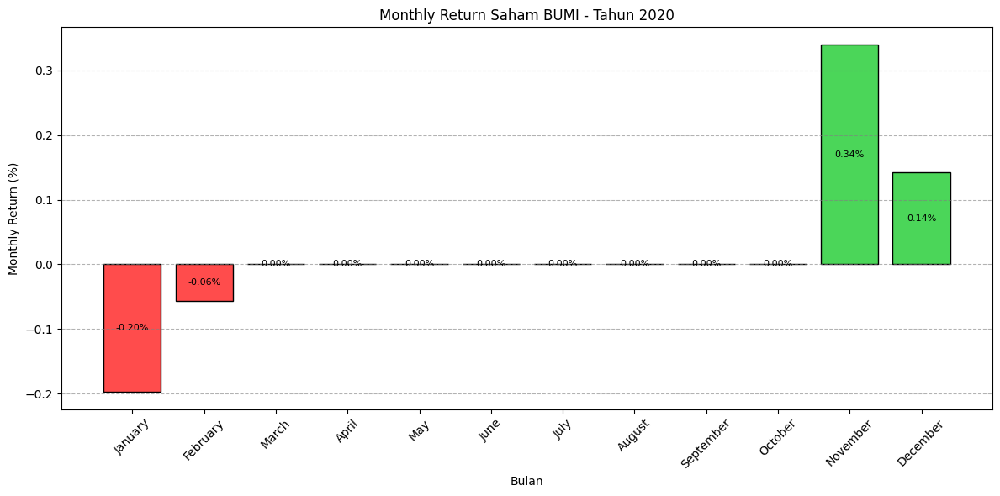

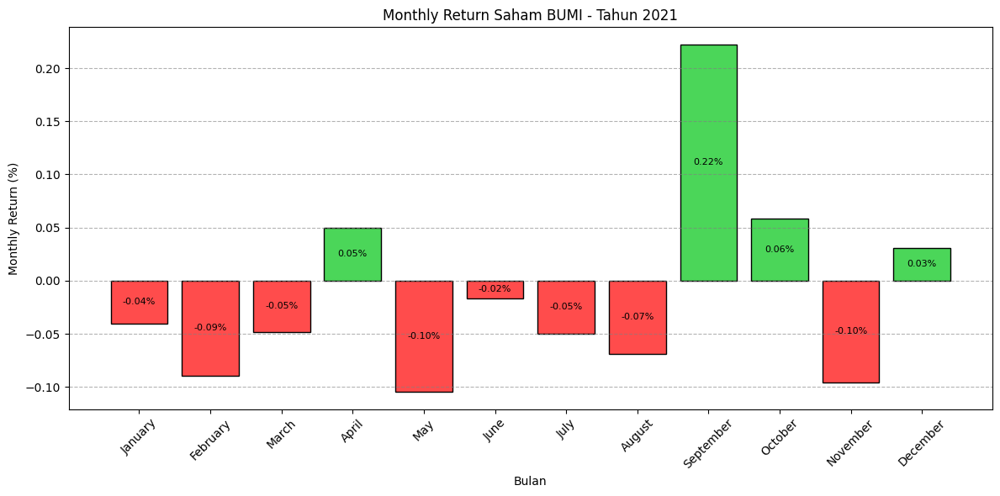

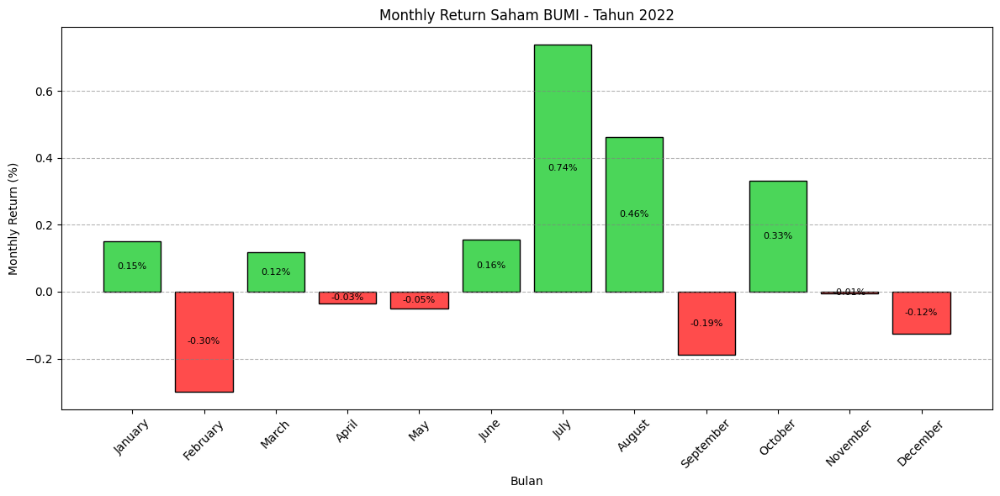

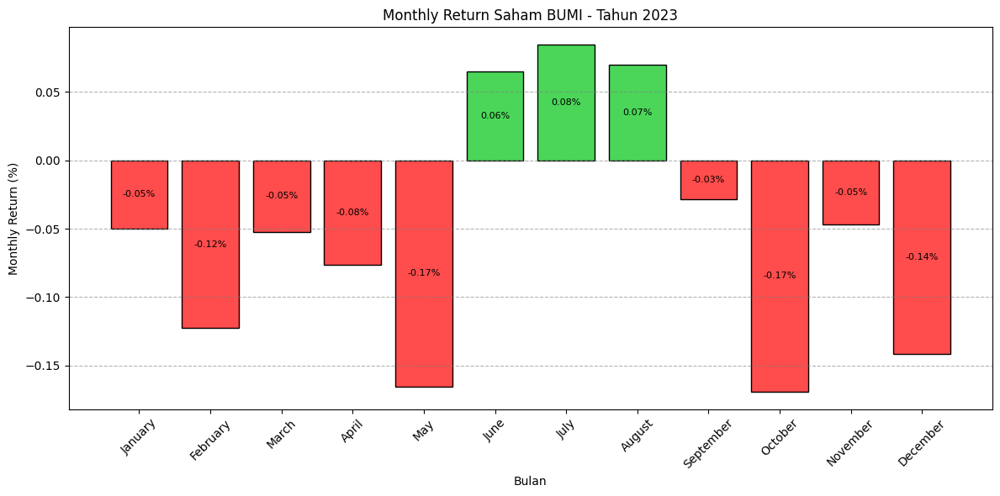

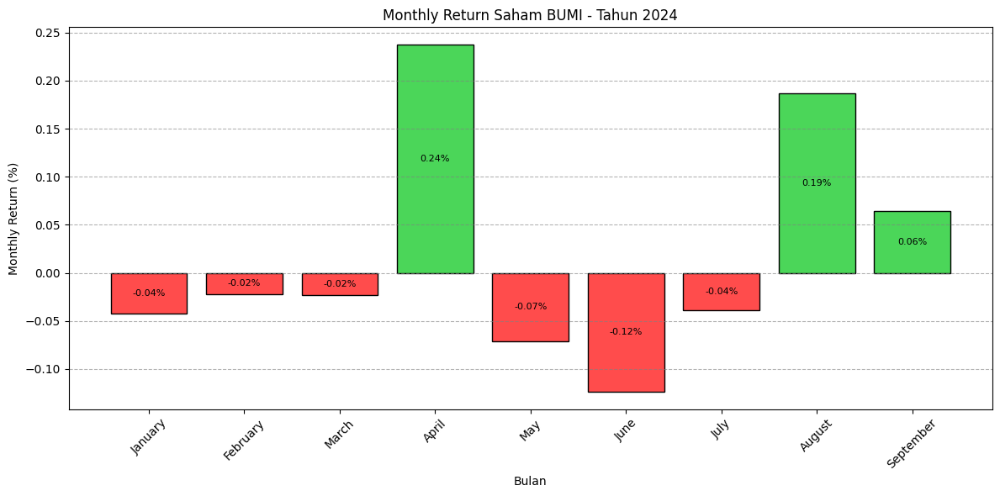

In [199]:
import calendar

# Menambahkan kolom 'Month' dan 'Year' untuk pengelompokan
bumi['Month'] = bumi['Date'].dt.to_period('M')  # Bulan dan Tahun
bumi['Year'] = bumi['Date'].dt.year

# Ambil harga penutupan untuk awal dan akhir bulan
monthly_return = bumi.groupby(['Year', 'Month'])['Adj Close'].agg(['first', 'last']).reset_index()

# Hitung return bulanan
monthly_return['Monthly Return'] = (monthly_return['last'] / monthly_return['first']) - 1

# Loop untuk tahun dari 2019 hingga 2024
for year in range(2019, 2025):
    # Pilih data untuk tahun tertentu
    monthly_return_year = monthly_return[monthly_return['Year'] == year]

    # Buat label bulan dalam format nama bulan
    monthly_return_year['Month'] = monthly_return_year['Month'].dt.month
    monthly_return_year['Month Name'] = monthly_return_year['Month'].apply(lambda x: calendar.month_name[x])

    # Membuat figure dan axis untuk vertical bar chart
    fig, ax = plt.subplots(figsize=(12, 6))  # Ukuran grafik disesuaikan

    # Menentukan warna bar berdasarkan nilai Monthly Return
    colors = ['#ff4c4c' if value < 0 else '#4bd659' for value in monthly_return_year['Monthly Return']]

    # Membuat vertical bar chart dengan warna yang disesuaikan
    bars = ax.bar(
        x=monthly_return_year['Month Name'],
        height=monthly_return_year['Monthly Return'],
        color=colors,
        edgecolor='black'
    )

    # Menambahkan anotasi persentase return di dalam setiap bar
    for bar in bars:
        height = bar.get_height()
        # Menambahkan label di dalam bar dengan font size lebih kecil dan warna hitam
        ax.text(bar.get_x() + bar.get_width() / 2, height / 2, f'{height:.2f}%', 
                ha='center', va='center', color='black', fontsize=8)

    # Menambahkan label sumbu dan judul
    ax.set_xlabel('Bulan')
    ax.set_ylabel('Monthly Return (%)')
    ax.set_title(f'Monthly Return Saham BUMI - Tahun {year}')

    # Menambahkan grid vertikal
    ax.grid(True, linestyle='--', color='gray', alpha=0.6, axis='y')

    # Menyesuaikan layout agar lebih rapi
    plt.xticks(rotation=45)  # Rotasi label pada sumbu X agar tidak saling tumpang tindih
    plt.tight_layout()

    # Menampilkan plot
    plt.show()

In [200]:
#lima_tahun_terakhir = df_adro.loc[df_adro['Date'].dt.year > 2019]

#date = lima_tahun_terakhir.groupby(['Date'])
#rata_bulan = date.aggregate({"Open" : np.mean, "High" : np.mean, "Low" : np.mean, "Close" : np.mean})
#rata_bulan.reset_index(level=0, inplace=True)

trade_bumi = go.Candlestick(x=bumi['Date'],
                       open=bumi['Open'],
                       high=bumi['High'],
                       low=bumi['Low'],
                       close=bumi['Close']
                      )

layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham BUMI',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

fig = go.Figure(data=trade_bumi, layout=layout)
fig.show()

In [201]:
# Pastikan 'Date' dalam format datetime
bumi['Date'] = pd.to_datetime(bumi['Date'])

# Membuat grafik area
fig = go.Figure()

# Menambahkan area untuk harga penutupan
fig.add_trace(go.Scatter(x=bumi['Date'],
                         y=bumi['Close'],
                         mode='lines',
                         fill='tozeroy',  # Mengisi area di bawah garis
                         name='Harga Penutupan',
                         line=dict(width=2, color='red'),  # Garis merah
                         fillcolor='rgba(255, 0, 0, 0.3)'))  # Area di bawah garis merah transparan

# Layout plot
layout = {
    'title': {
        'text': 'Perkembangan Harga Saham BUMI',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickformat': '%Y',  # Format label hanya tahun
        'tickmode': 'auto'
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width': 1200,
    'height': 600
}

fig.update_layout(layout)
fig.show()

In [207]:
# Filter data untuk lima tahun terakhir
lima_tahun_terakhir = bumi.loc[bumi['Date'].dt.year > 2019]

# Mengelompokkan berdasarkan 'Date' dan menghitung rata-rata per tanggal
date = lima_tahun_terakhir.groupby(['Date'])
rata_bulan_bumi = date.aggregate({"Open": np.mean, "High": np.mean, "Low": np.mean, "Close": np.mean})
rata_bulan_bumi.reset_index(level=0, inplace=True)

# Membuat grafik Candlestick
trade_bumi = go.Candlestick(x=rata_bulan_bumi['Date'],
                       open=rata_bulan_bumi['Open'].values.tolist(),
                       high=rata_bulan_bumi['High'].values.tolist(),
                       low=rata_bulan_bumi['Low'].values.tolist(),
                       close=rata_bulan_bumi['Close'].values.tolist())

# Menentukan secara manual tanggal awal dan akhir serta harga support dan resistance
start_date = '2022-06-01'  # Titik awal garis di sumbu X
end_date = '2024-12-31'    # Titik akhir garis di sumbu X

# Menentukan harga support dan resistance secara manual di sumbu Y
start_price_support = 50   # Harga support di titik awal
end_price_support = 70     # Harga support di titik akhir

start_price_resistance = 265  # Harga resistance di titik awal
end_price_resistance = 80    # Harga resistance di titik akhir

# Garis support
support_line = go.Scatter(
    x=[start_date, end_date],  # Rentang waktu yang ditampilkan
    y=[start_price_support, end_price_support],  # Harga support di titik awal dan akhir
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Support Line'
)

# Garis resistance
resistance_line = go.Scatter(
    x=[start_date, end_date],  # Rentang waktu yang ditampilkan
    y=[start_price_resistance, end_price_resistance],  # Harga resistance di titik awal dan akhir
    mode='lines',
    line=dict(color='green', dash='dash'),
    name='Resistance Line'
)

# Mengatur layout (seperti sebelumnya)
layout = {
    'title': {
        'text': 'Perkembangan Harga Saham BUMI <br> 5 Tahun Terakhir </i>',
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top'
    },
    'xaxis': {
        'title': 'Waktu',
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickformat': '%Y',  # Hanya menampilkan tahun
        'tickmode': 'linear',  # Mode linier untuk tampilan label
        'dtick': "M12"  # Menampilkan setiap tahun (interval 12 bulan)
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width': 1200,
    'height': 650
}

# Membuat dan menampilkan grafik
data = [trade_bumi, support_line, resistance_line]
fig = go.Figure(data=data, layout=layout)
fig.show()


In [205]:
# Pastikan kolom 'Date' adalah tipe datetime
bumi['Date'] = pd.to_datetime(bumi['Date'])

# Filter data untuk tahun 2023
bumi_2023 = bumi[bumi['Date'].dt.year == 2023]

# moving average untuk periode tertentu
ma_day = [10, 20, 50]
for ma in ma_day:
    bumi_2023[f'MA {ma} hari'] = bumi_2023['Close'].rolling(ma).mean()

# Membuat Candlestick chart untuk data harian di tahun 2023
candlestick_bumi = go.Candlestick(x=bumi_2023['Date'],
                       open=bumi_2023['Open'],
                       high=bumi_2023['High'],
                       low=bumi_2023['Low'],
                       close=bumi_2023['Close']
                      )

# membuat line chart untuk moving averages
lines = []
for ma in ma_day:
    lines.append(go.Scatter(x=bumi_2023['Date'],
                            y=bumi_2023[f'MA {ma} hari'],
                            mode='lines',
                            name=f'MA {ma} hari'))

# Mendapatkan tanggal di awal setiap bulan
tickvals = pd.date_range(start='2023-01-01', end='2023-12-31', freq='MS')

# Layout untuk plot dengan label per bulan pada sumbu X
layout = {
    'title': {
            'text' : 'Perkembangan Harga Saham BUMI (Tahun 2023)',
            'x' : 0.5,
            'xanchor' : 'center',
            'yanchor' : 'top'
        },
    'xaxis': {
        'title': 'Waktu',  # Label pada sumbu x
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickvals': tickvals,  # Tampilkan label hanya di awal setiap bulan
        'ticktext': ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'],  # Teks label bulan
        'tickangle' : -45
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',  # Label pada sumbu y
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

# Menampilkan plot dengan data harian dan label per bulan
fig = go.Figure(data=[candlestick_bumi] + lines, layout=layout)
fig.show()

In [206]:
# Pastikan kolom 'Date' adalah tipe datetime
bumi['Date'] = pd.to_datetime(bumi['Date'])

# Filter data untuk 5 tahun terakhir (2019-2023)
bumi_5_years = bumi[(bumi['Date'].dt.year >= 2019) & (bumi['Date'].dt.year <= 2024)]

# Moving average untuk periode tertentu
ma_day = [10, 20, 50]
for ma in ma_day:
    bumi_5_years[f'MA {ma} hari'] = bumi_5_years['Close'].rolling(ma).mean()

# Membuat Candlestick chart untuk data harian dari 2019 hingga 2024
candlestick_bumi_5 = go.Candlestick(x=bumi_5_years['Date'],
                             open=bumi_5_years['Open'],
                             high=bumi_5_years['High'],
                             low=bumi_5_years['Low'],
                             close=bumi_5_years['Close'],
                             increasing={'line' : {'color' : '#1c7c55', 'width' : 3}},
                             decreasing={'line' : {'color' : '#ec1c24', 'width' : 3}})

# Membuat line chart untuk moving averages
lines = []
for ma in ma_day:
    lines.append(go.Scatter(x=bumi_5_years['Date'],
                            y=bumi_5_years[f'MA {ma} hari'],
                            mode='lines',
                            name=f'MA {ma} hari'))

# Mendapatkan tanggal di awal setiap tahun
tickvals = pd.date_range(start='2019-01-01', end='2024-09-04', freq='YS')

# Layout untuk plot dengan label per tahun pada sumbu X
layout = {
    'title': {
        'text' : 'Perkembangan Harga Saham BUMI (2019 - 2023)',
        'x' : 0.5,
        'xanchor' : 'center',
        'yanchor' : 'top'
    },
    'xaxis': {
        'title': 'Waktu',  # Label pada sumbu x
        'rangeslider': {'visible': False},
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid X-axis
        'tickvals': tickvals,  # Tampilkan label hanya di awal setiap tahun
        'ticktext': ['2019', '2020', '2021', '2022', '2023', '2024'],  # Teks label tahun
        'tickangle': -45
    },
    'yaxis': {
        'title': 'Harga Saham (IDR)',  # Label pada sumbu y
        'gridcolor': 'rgba(255, 255, 255, 0.2)',  # Warna garis grid Y-axis
    },
    'paper_bgcolor': 'black',  # Background di luar plot
    'plot_bgcolor': 'black',  # Background di dalam plot
    'font': {
        'color': 'white'  # Warna teks
    },
    'width' : 1200,
    'height' : 600
}

# Menampilkan plot dengan data harian dan label per tahun
fig = go.Figure(data=[candlestick_bumi_5] + lines, layout=layout)
fig.show()

#### 3. Saham BYAN